<a href="https://colab.research.google.com/github/adnanazizpatwary/HCV_Detection-Project-using-ML/blob/main/final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer,KNNImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.model_selection import cross_val_score, KFold

from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import ConfusionMatrixDisplay


In [ ]:
df = pd.read_csv('/content/HepatitisCdata.csv',usecols=['Category','Age','Sex','ALB','ALP','ALT','AST','BIL','CHE','CHOL','CREA','GGT','PROT'])
dff=df.copy()
df.head()


,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
0,0=Blood Donor,32,m,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,0=Blood Donor,32,m,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,0=Blood Donor,32,m,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,0=Blood Donor,32,m,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,0=Blood Donor,32,m,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7


In [ ]:
df['Category'].value_counts()

,count
Category,
0=Blood Donor,533
3=Cirrhosis,30
1=Hepatitis,24
2=Fibrosis,21
0s=suspect Blood Donor,7


In [ ]:
df.isnull().mean()*100

,0
Category,0.000000
Age,0.000000
Sex,0.000000
ALB,0.162602
ALP,2.926829
ALT,0.162602
AST,0.000000
BIL,0.000000
CHE,0.000000
CHOL,1.626016


In [ ]:
df.describe()

,Age,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
count,615.000000,614.000000,597.000000,614.000000,615.000000,615.000000,615.000000,605.000000,615.000000,615.000000,614.000000
mean,47.408130,41.620195,68.283920,28.450814,34.786341,11.396748,8.196634,5.368099,81.287805,39.533171,72.044137
std,10.055105,5.780629,26.028315,25.469689,33.090690,19.673150,2.205657,1.132728,49.756166,54.661071,5.402636
min,19.000000,14.900000,11.300000,0.900000,10.600000,0.800000,1.420000,1.430000,8.000000,4.500000,44.800000
25%,39.000000,38.800000,52.500000,16.400000,21.600000,5.300000,6.935000,4.610000,67.000000,15.700000,69.300000
50%,47.000000,41.950000,66.200000,23.000000,25.900000,7.300000,8.260000,5.300000,77.000000,23.300000,72.200000
75%,54.000000,45.200000,80.100000,33.075000,32.900000,11.200000,9.590000,6.060000,88.000000,40.200000,75.400000
max,77.000000,82.200000,416.600000,325.300000,324.000000,254.000000,16.410000,9.670000,1079.100000,650.900000,90.000000


# Dividing dataset into train test split

In [ ]:
x= df.iloc[:,1:13]
y= df['Category']
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.2,random_state=42)

#Imputing Missing value using median and coverting categorical input column(Sex) into binary

In [ ]:
imputer1 = SimpleImputer(strategy='median')
imputer2 = SimpleImputer(strategy='median')
imputer3 = SimpleImputer(strategy='median')
imputer4 = SimpleImputer(strategy='median')
imputer5 = SimpleImputer(strategy='median')
from sklearn.preprocessing import OneHotEncoder
imputer6 = OneHotEncoder(sparse_output=False, drop='first')



In [ ]:
trf = ColumnTransformer(transformers=[
    ('imputer1',imputer1,['ALB']),
    ('imputer2',imputer2,['ALP']),
    ('imputer3',imputer3,['ALT']),
    ('imputer4',imputer4,['CHOL']),
    ('imputer5',imputer5,['PROT']),
    ('imputer6',imputer6,['Sex'])

],remainder='passthrough')

In [ ]:
trf.fit(x_train)

/usr/local/lib/python3.10/dist-packages/sklearn/compose/_column_transformer.py:1623: FutureWarning: 
The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).

  warnings.warn(


ColumnTransformer(remainder='passthrough',
                  transformers=[('imputer1', SimpleImputer(strategy='median'),
                                 ['ALB']),
                                ('imputer2', SimpleImputer(strategy='median'),
                                 ['ALP']),
                                ('imputer3', SimpleImputer(strategy='median'),
                                 ['ALT']),
                                ('imputer4', SimpleImputer(strategy='median'),
                                 ['CHOL']),
                                ('imputer5', SimpleImputer(strategy='median'),
                                 ['PROT']),
                                ('imputer6',
                                 OneHotEncoder(drop='first',
                                               sparse_output=False),
                                 ['Sex'])])

In [ ]:
trf.named_transformers_['imputer1'].statistics_

array([42.])

In [ ]:
trf.named_transformers_['imputer2'].statistics_

array([66.3])

In [ ]:
x_train = trf.transform(x_train)
x_test = trf.transform(x_test)
x_train = pd.DataFrame(x_train)
x_test = pd.DataFrame(x_test)

In [ ]:
x_train.head()

,0,1,2,3,4,5,6,7,8,9,10,11
0,36.6,71.3,28.9,4.66,66.3,1.0,39.0,25.9,6.1,5.70,77.0,22.6
1,45.8,62.5,20.7,4.78,75.5,1.0,39.0,22.8,45.5,8.61,77.0,15.9
2,44.5,61.2,14.4,5.00,72.0,1.0,53.0,18.1,8.0,6.95,70.0,18.3
3,26.3,52.5,39.5,3.53,51.0,0.0,58.0,77.2,5.8,5.15,40.0,31.2
4,42.4,137.2,14.2,5.30,74.4,0.0,33.0,13.1,3.4,8.23,48.0,25.7


#Applying labelencoder to categorical output column

In [ ]:
le = LabelEncoder()
le.fit(y_train)
y_train=le.transform(y_train)
y_test=le.transform(y_test)

#italicized textScaling the input column usning standardscaller

In [ ]:
trf2 = ColumnTransformer([
    ('scaler',StandardScaler(),slice(0,12))
],remainder='passthrough')

In [ ]:
trf2.fit(x_train)

ColumnTransformer(remainder='passthrough',
                  transformers=[('scaler', StandardScaler(),
                                 slice(0, 12, None))])

In [ ]:
x_train=trf2.transform(x_train)
x_test = trf2.transform(x_test)

In [ ]:
x_train = pd.DataFrame(x_train)
x_test = pd.DataFrame(x_test)
y_train = pd.DataFrame(y_train)
y_test = pd.DataFrame(y_test)

In [ ]:
x_train1 = x_train.copy()
y_train1=y_train.copy()

**checking if there any duplicate column**

In [ ]:
def get_duplicate_columns(df):

    duplicate_columns = {}
    seen_columns = {}

    for column in df.columns:
        current_column = df[column]

        # Convert column data to bytes
        try:
            current_column_hash = current_column.values.tobytes()
        except AttributeError:
            current_column_hash = current_column.to_string().encode()

        if current_column_hash in seen_columns:
            if seen_columns[current_column_hash] in duplicate_columns:
                duplicate_columns[seen_columns[current_column_hash]].append(column)
            else:
                duplicate_columns[seen_columns[current_column_hash]] = [column]
        else:
            seen_columns[current_column_hash] = column

    return duplicate_columns

In [ ]:
duplicate_columns = get_duplicate_columns(x_train)
print(duplicate_columns)

{}


In [ ]:
x_train

,0,1,2,3,4,5,6,7,8,9,10,11
0,-0.901069,0.163713,0.028141,-0.638001,-1.056130,0.855800,-0.835559,-0.257913,-0.280688,-1.157568,-0.080611,-0.322796
1,0.726659,-0.252893,-0.320328,-0.535230,0.667928,0.855800,-0.835559,-0.346239,1.817927,0.219224,-0.080611,-0.486144
2,0.496654,-0.314437,-0.588055,-0.346817,0.012036,0.855800,0.591500,-0.480152,-0.179486,-0.566162,-0.208413,-0.427632
3,-2.723417,-0.726309,0.478601,-1.605761,-3.923313,-1.168497,1.101164,1.203739,-0.296667,-1.417786,-0.756136,-0.113126
4,0.125108,3.283526,-0.596554,-0.089890,0.461790,-1.168497,-1.447156,-0.622613,-0.424502,0.039437,-0.610077,-0.247217
...,...,...,...,...,...,...,...,...,...,...,...,...
487,-0.317210,-0.233956,1.846980,1.374596,0.218173,0.855800,-0.937492,0.254948,-0.051651,1.302678,0.321053,1.278990
488,0.532040,0.334143,-0.129095,-1.006264,0.030776,0.855800,-0.631693,-0.420318,-0.270035,1.037729,-0.135383,-0.295978
489,-0.334903,-0.873068,-0.120596,-1.468733,-0.006704,0.855800,1.203097,-0.386128,0.710029,-0.305944,0.083706,-0.417880
490,0.478961,-0.726309,-0.503062,1.177618,0.218173,-1.168497,0.081836,-0.329143,-0.365911,0.432130,-0.135383,-0.622674


In [ ]:
y.value_counts()

,count
Category,
0=Blood Donor,533
3=Cirrhosis,30
1=Hepatitis,24
2=Fibrosis,21
0s=suspect Blood Donor,7


In [ ]:
y_train.value_counts()

,count
0,
0,437
4,21
2,15
3,15
1,4


#Appying some model without using smote

#knn

In [ ]:
class_names=['Blood Donor','Suspected Blood Donor','Hepatitis','Fibrosis','Cirosis']

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision

KNN Accuracy:  0.8130081300813008
Classification Report:
               precision    recall  f1-score   support

           0       0.81      1.00      0.90        96
           1       0.00      0.00      0.00         3
           2       0.00      0.00      0.00         9
           3       0.50      0.17      0.25         6
           4       1.00      0.33      0.50         9

    accuracy                           0.81       123
   macro avg       0.46      0.30      0.33       123
weighted avg       0.73      0.81      0.75       123

Confusion Matrix:
 [[96  0  0  0  0]
 [ 3  0  0  0  0]
 [ 8  0  0  1  0]
 [ 5  0  0  1  0]
 [ 6  0  0  0  3]]


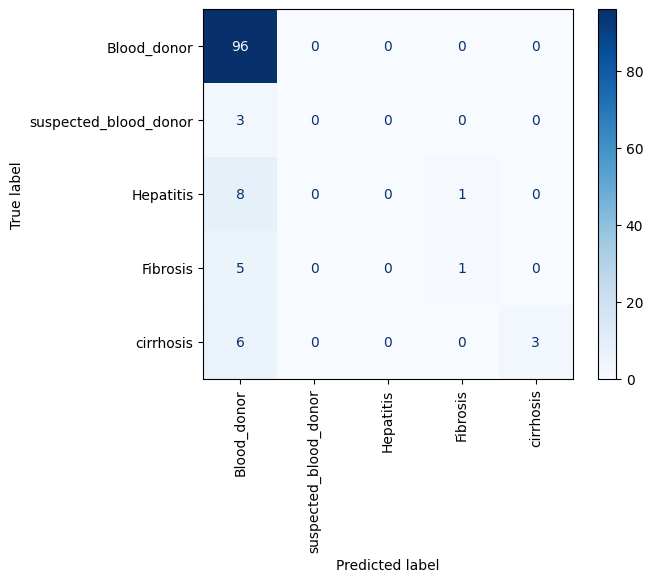

In [ ]:
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)
y_pred=knn.predict(x_test)
print("KNN Accuracy: ",accuracy_score(y_test,y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))




class_names = ['Blood_donor', 'suspected_blood_donor', 'Hepatitis', 'Fibrosis', 'cirrhosis']

# Get the predicted values


# Generate the confusion matrix display
disp = ConfusionMatrixDisplay.from_estimator(knn, x_test, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
# Define the model (replace this with your specific model)
model1 = (knn)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.8989899  0.8989899  0.91836735 0.95918367 0.90816327]
Mean Accuracy: 0.9167388167388169


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

#logistic regression

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression model accuracy:  0.8943089430894309
Classification Report:
               precision    recall  f1-score   support

           0       0.91      1.00      0.96        96
           1       0.67      0.67      0.67         3
           2       1.00      0.33      0.50         9
           3       0.60      0.50      0.55         6
           4       0.86      0.67      0.75         9

    accuracy                           0.89       123
   macro avg       0.81      0.63      0.68       123
weighted avg       0.90      0.89      0.88       123

Confusion Matrix:
 [[96  0  0  0  0]
 [ 1  2  0  0  0]
 [ 3  0  3  2  1]
 [ 3  0  0  3  0]
 [ 2  1  0  0  6]]


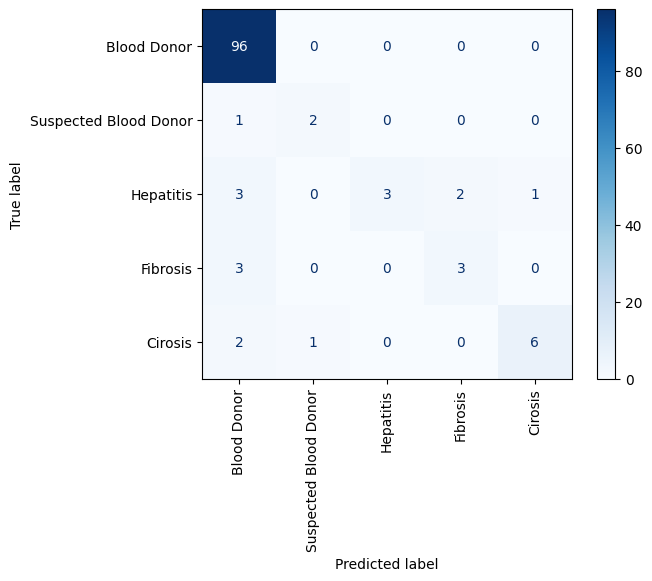

In [ ]:
lr =  LogisticRegression(multi_class='multinomial')
lr.fit(x_train,y_train)
y1_pred=lr.predict(x_test)
print("LogisticRegression model accuracy: ",accuracy_score(y_test,y1_pred))
print("Classification Report:\n", classification_report(y_test, y1_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y1_pred))

disp = ConfusionMatrixDisplay.from_estimator(lr, x_test, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()

#kfold for logistic regression

In [ ]:
# Define the model (replace this with your specific model)
model1 = (lr)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.8989899  0.8989899  0.96938776 0.96938776 0.93877551]
Mean Accuracy: 0.9351061636775923


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

#random forest

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Random Forest accuracy:  0.8536585365853658
Classification Report:
               precision    recall  f1-score   support

           0       0.86      1.00      0.92        96
           1       0.00      0.00      0.00         3
           2       1.00      0.11      0.20         9
           3       0.50      0.33      0.40         6
           4       1.00      0.67      0.80         9

    accuracy                           0.85       123
   macro avg       0.67      0.42      0.46       123
weighted avg       0.84      0.85      0.81       123

Confusion Matrix:
 [[96  0  0  0  0]
 [ 2  0  0  1  0]
 [ 7  0  1  1  0]
 [ 4  0  0  2  0]
 [ 3  0  0  0  6]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


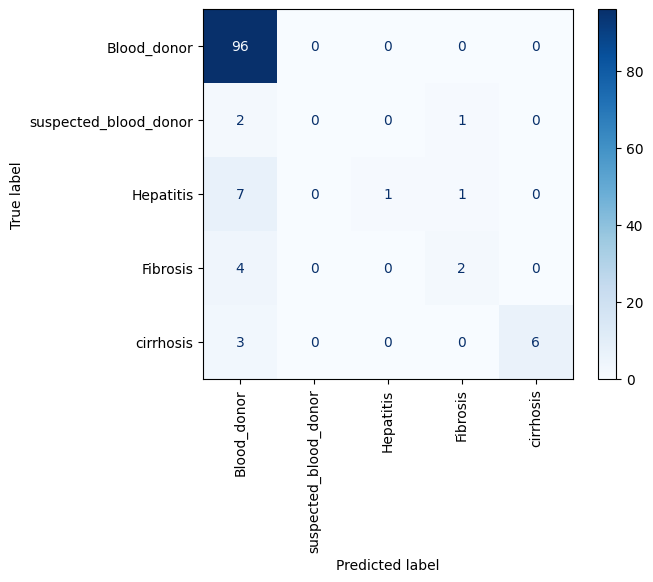

In [ ]:
rf = RandomForestClassifier()
rf.fit(x_train,y_train)
y2_pred= rf.predict(x_test)
print("Random Forest accuracy: ",accuracy_score(y_test,y2_pred))
print("Classification Report:\n", classification_report(y_test, y2_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y2_pred))
disp = ConfusionMatrixDisplay.from_estimator(rf, x_test, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()

#kfold for random forest

In [ ]:
# Define the model (replace this with your specific model)
model1 = (rf)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example usi

Cross-Validation Results: [0.8989899  0.87878788 0.93877551 0.95918367 0.94897959]
Mean Accuracy: 0.9249433106575964


#adboost

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


adaboost accuracy:  0.8699186991869918
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.99      0.95        96
           1       1.00      0.33      0.50         3
           2       0.43      0.33      0.38         9
           3       0.67      0.33      0.44         6
           4       0.86      0.67      0.75         9

    accuracy                           0.87       123
   macro avg       0.77      0.53      0.60       123
weighted avg       0.86      0.87      0.85       123

Confusion Matrix:
 [[95  0  1  0  0]
 [ 0  1  0  1  1]
 [ 6  0  3  0  0]
 [ 3  0  1  2  0]
 [ 1  0  2  0  6]]


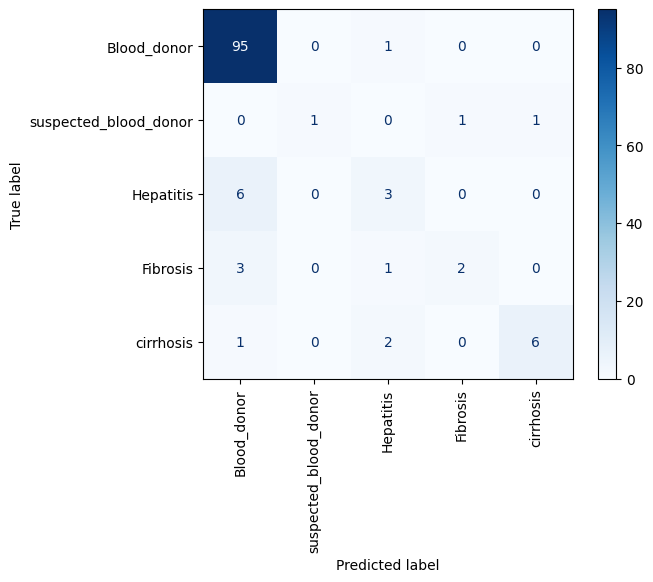

In [ ]:
ab= AdaBoostClassifier()
ab.fit(x_train,y_train)
y3_pred= ab.predict(x_test)
print("adaboost accuracy: ",accuracy_score(y_test,y3_pred))
print("Classification Report:\n", classification_report(y_test, y3_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y3_pred))
disp = ConfusionMatrixDisplay.from_estimator(ab, x_test, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()

#kfold for adaboost

In [ ]:
# Define the model (replace this with your specific model)
model1 = (ab)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

Cross-Validation Results: [0.88888889 0.86868687 0.93877551 0.95918367 0.91836735]
Mean Accuracy: 0.9147804576376005


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


#xgboost

Accuracy for xgboost:  0.9024390243902439
Classification Report:
               precision    recall  f1-score   support

           0       0.92      1.00      0.96        96
           1       1.00      0.33      0.50         3
           2       0.71      0.56      0.63         9
           3       0.75      0.50      0.60         6
           4       0.86      0.67      0.75         9

    accuracy                           0.90       123
   macro avg       0.85      0.61      0.69       123
weighted avg       0.90      0.90      0.89       123

Confusion Matrix:
 [[96  0  0  0  0]
 [ 2  1  0  0  0]
 [ 2  0  5  1  1]
 [ 3  0  0  3  0]
 [ 1  0  2  0  6]]


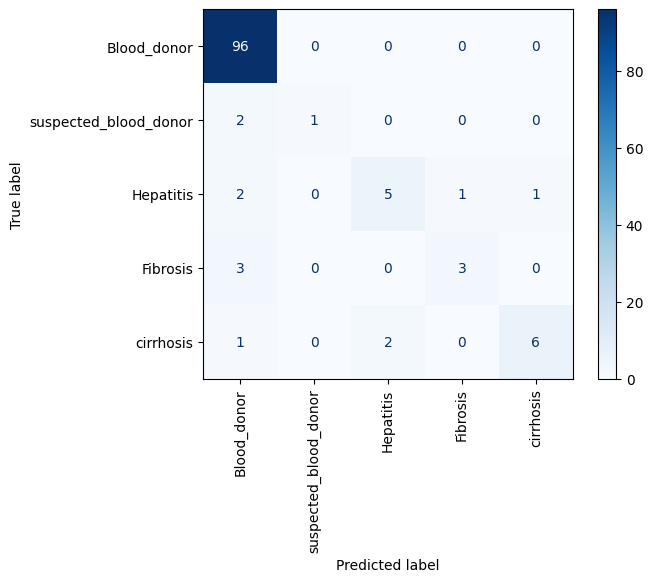

In [ ]:
xgb_model= xgb.XGBClassifier(objective="multi:softprob", random_state=42)
xgb_model.fit(x_train,y_train)
y4_pred= xgb_model.predict(x_test)
print("Accuracy for xgboost: ",accuracy_score(y4_pred,y_test))
print("Classification Report:\n", classification_report(y_test, y4_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y4_pred))

disp = ConfusionMatrixDisplay.from_estimator(xgb_model, x_test, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()

#kfold for xg boost

In [ ]:
# Define the model (replace this with your specific model)
model1 = (xgb_model)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.8989899  0.87878788 0.93877551 0.96938776 0.95918367]
Mean Accuracy: 0.9290249433106575


#decission tree

accuracy for Decsion Tree:  0.8455284552845529
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.98      0.95        96
           1       0.67      0.67      0.67         3
           2       0.36      0.44      0.40         9
           3       0.40      0.33      0.36         6
           4       0.67      0.22      0.33         9

    accuracy                           0.85       123
   macro avg       0.61      0.53      0.54       123
weighted avg       0.84      0.85      0.83       123

Confusion Matrix:
 [[94  0  2  0  0]
 [ 1  2  0  0  0]
 [ 2  0  4  2  1]
 [ 3  0  1  2  0]
 [ 1  1  4  1  2]]


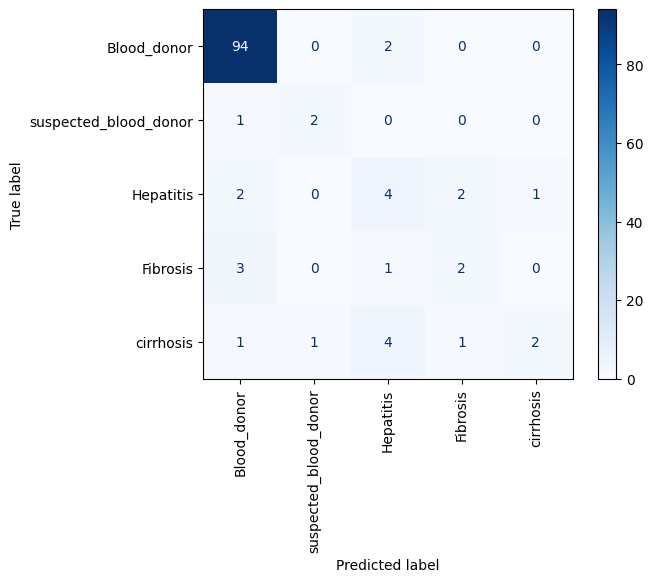

In [ ]:
dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)
y5_pred=dt.predict(x_test)
print("accuracy for Decsion Tree: ",accuracy_score(y5_pred,y_test))
print("Classification Report:\n", classification_report(y_test, y5_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y5_pred))

disp = ConfusionMatrixDisplay.from_estimator(dt, x_test, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()

#kfold for decision treee

In [ ]:
# Define the model (replace this with your specific model)
model1 = (dt)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.87878788 0.85858586 0.93877551 0.96938776 0.92857143]
Mean Accuracy: 0.9148216862502577


#SVM

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precisio

Accuracy: 0.8130081300813008
Classification Report:
               precision    recall  f1-score   support

           0       0.85      1.00      0.92        96
           1       0.00      0.00      0.00         3
           2       0.00      0.00      0.00         9
           3       0.00      0.00      0.00         6
           4       0.44      0.44      0.44         9

    accuracy                           0.81       123
   macro avg       0.26      0.29      0.27       123
weighted avg       0.70      0.81      0.75       123

Confusion Matrix:
 [[96  0  0  0  0]
 [ 0  0  0  0  3]
 [ 7  0  0  1  1]
 [ 5  0  0  0  1]
 [ 5  0  0  0  4]]


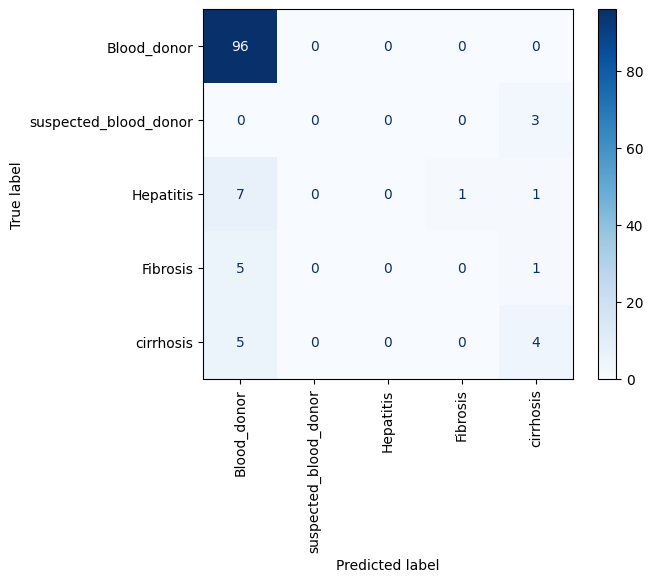

In [ ]:
from sklearn.svm import SVC
# Initialize the SVM classifier
model = SVC(probability=True)  # You can choose different kernels (linear, rbf, poly, etc.)

# Train the classifier on the training set
model.fit(x_train, y_train)

# Make predictions on the test set
y6_pred = model.predict(x_test)

# Evaluate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')
print("Classification Report:\n", classification_report(y_test, y6_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y6_pred))
disp = ConfusionMatrixDisplay.from_estimator(model, x_test, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()

#kfold for svm

In [ ]:
# Define the model (replace this with your specific model)
model1 = (model)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

Cross-Validation Results: [0.8989899  0.90909091 0.93877551 0.95918367 0.94897959]
Mean Accuracy: 0.9310039167182025


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


# cross validation for all of them

In [ ]:
print("KNN crossvalidate accuracy:",np.mean(cross_val_score(knn,x_train,y_train,scoring='accuracy',cv=10)))
print("logisticRegression crossvalidate accuracy",np.mean(cross_val_score(lr,x_train,y_train,scoring='accuracy',cv=10)))
print("RandOM forest crossvalidate accuracy:",np.mean(cross_val_score(rf,x_train,y_train,scoring='accuracy',cv=10)))
print("AdaBoost crossvalidate accuracy:",np.mean(cross_val_score(ab,x_train,y_train,scoring='accuracy',cv=10)))
print("XGBOOST crossvalidate accuracy:",np.mean(cross_val_score(xgb_model,x_train,y_train,scoring='accuracy',cv=10)))
print("Decision treee crossvalidate accuracy:",np.mean(cross_val_score(dt,x_train,y_train,scoring='accuracy',cv=10)))
print("SVM crossvalidate accuracy:",np.mean(cross_val_score(model,x_train,y_train,scoring='accuracy',cv=10)))


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:233: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3

KNN crossvalidate accuracy: 0.9187755102040815


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

logisticRegression crossvalidate accuracy 0.935061224489796


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/li

RandOM forest crossvalidate accuracy: 0.9309795918367347


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/pyth

AdaBoost crossvalidate accuracy: 0.8943265306122449


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(


XGBOOST crossvalidate accuracy: 0.9370612244897959


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(


Decision treee crossvalidate accuracy: 0.9085714285714286


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:737: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/pyth

SVM crossvalidate accuracy: 0.9329795918367347


#**using smote balancing the imbalance dataset**

In [ ]:
# Assume X_train, X_test, y_train, and y_test are already defined
# Combine X (features) and y (target) for both train and test sets
train_data = pd.concat([x_train, y_train], axis=1)
test_data = pd.concat([x_test, y_test], axis=1)

# Add a column to differentiate between train and test data
# train_data['dataset'] = 'train'
# test_data['dataset'] = 'test'

# Combine train and test data into one DataFrame
combined_data = pd.concat([train_data, test_data])

# Reset the index of the combined dataframe
combined_data.reset_index(drop=True, inplace=True)
combined_data=pd.DataFrame(combined_data)

# Show the combined dataframe



In [ ]:
combined_data.iloc[:,-1].value_counts()

,count
0,
0,533
4,30
2,24
3,21
1,7


In [ ]:
df['Category'].value_counts()

,count
Category,
0=Blood Donor,533
3=Cirrhosis,30
1=Hepatitis,24
2=Fibrosis,21
0s=suspect Blood Donor,7


In [ ]:
combined_data.sample(5)

,0,1,2,3,4,5,6,7,8,9,10,11,0
175,-0.016434,-0.413854,-0.082349,-0.775029,-0.156622,0.855800,0.489567,-0.266460,-0.445807,0.663961,0.229765,-0.069241,0
318,-0.954147,-0.025653,0.019642,-0.115582,0.424311,0.855800,-0.427828,-0.200928,-0.312647,0.190836,0.284538,-0.456888,0
460,-0.281825,0.793357,-0.222587,-0.209789,0.499270,-1.168497,0.591500,-0.366183,-0.227424,0.119868,-0.208413,1.140022,0
473,0.213571,-0.603221,-0.554058,-0.089890,-0.006704,-1.168497,-0.122029,-0.146793,-0.413849,0.105674,-0.372730,-0.166762,0
101,0.337420,1.711784,0.172628,-0.612309,0.667928,0.855800,1.814694,-0.021427,-0.195465,0.039437,0.138478,-0.366681,0


In [ ]:
# Define feature columns and target column
x = combined_data.iloc[:, :-1]  # All rows, all columns except the last one
y = combined_data.iloc[:, -1]   # All rows, only the last column


In [ ]:
counter = Counter(y_train)
print(counter)
min_samples = min(counter.values())
print(min_samples)
k_neighbors =max(1,min(5, min_samples-1))
smote= SMOTE(k_neighbors=k_neighbors,random_state=42)
# smote= SMOTE(random_state=42
x,y=smote.fit_resample(x,y)

Counter({0: 1})
1


In [ ]:
y.value_counts()

,count
0,
0,533
3,533
4,533
2,533
1,533


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)


In [ ]:

# smote= SMOTE(k_neighbors=k_neighbors,random_state=42)
# # smote= SMOTE(random_state=42
# x_train,y_train=smote.fit_resample(x_train,y_train)

In [ ]:
x_train.shape,y_train.shape

((2132, 12), (2132,))

In [ ]:
df

,Category,Age,Sex,ALB,ALP,ALT,AST,BIL,CHE,CHOL,CREA,GGT,PROT
0,0=Blood Donor,32,m,38.5,52.5,7.7,22.1,7.5,6.93,3.23,106.0,12.1,69.0
1,0=Blood Donor,32,m,38.5,70.3,18.0,24.7,3.9,11.17,4.80,74.0,15.6,76.5
2,0=Blood Donor,32,m,46.9,74.7,36.2,52.6,6.1,8.84,5.20,86.0,33.2,79.3
3,0=Blood Donor,32,m,43.2,52.0,30.6,22.6,18.9,7.33,4.74,80.0,33.8,75.7
4,0=Blood Donor,32,m,39.2,74.1,32.6,24.8,9.6,9.15,4.32,76.0,29.9,68.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
610,3=Cirrhosis,62,f,32.0,416.6,5.9,110.3,50.0,5.57,6.30,55.7,650.9,68.5
611,3=Cirrhosis,64,f,24.0,102.8,2.9,44.4,20.0,1.54,3.02,63.0,35.9,71.3
612,3=Cirrhosis,64,f,29.0,87.3,3.5,99.0,48.0,1.66,3.63,66.7,64.2,82.0
613,3=Cirrhosis,46,f,33.0,NaN,39.0,62.0,20.0,3.56,4.20,52.0,50.0,71.0


**use filter methods for feature selection using variance threshold technique**

In [ ]:
var_thres=VarianceThreshold(threshold=0.05)
var_thres.fit(x_train)
sum(var_thres.get_support()) #every column variance is higher than threshold

12

In [ ]:
y_train = y_train.values.flatten()

#Using wrapper method backward elemination technique selecting best feature for model wised

#KNN

In [ ]:
knn= KNeighborsClassifier()
knn.fit(x_train,y_train)
y_pred=knn.predict(x_test)
print("KNN Accuracy: ",accuracy_score(y_test,y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

KNN Accuracy:  0.9887429643527205
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.95      0.97       110
           1       1.00      1.00      1.00       117
           2       0.97      1.00      0.99       102
           3       0.97      1.00      0.99       107
           4       1.00      1.00      1.00        97

    accuracy                           0.99       533
   macro avg       0.99      0.99      0.99       533
weighted avg       0.99      0.99      0.99       533

Confusion Matrix:
 [[104   0   3   3   0]
 [  0 117   0   0   0]
 [  0   0 102   0   0]
 [  0   0   0 107   0]
 [  0   0   0   0  97]]


##roc for knn

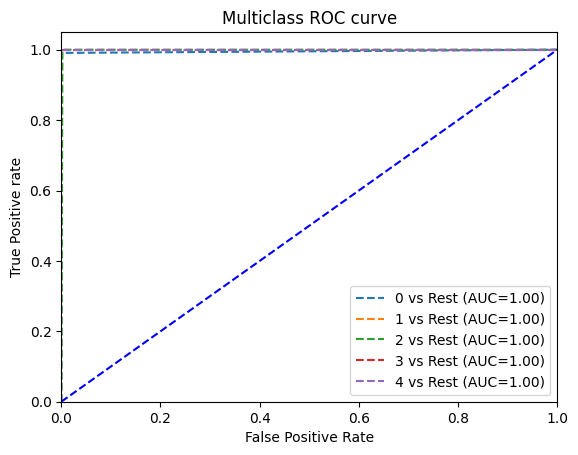

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=knn.predict_proba(x_test)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

In [ ]:
df['Category'].unique()

array(['0=Blood Donor', '0s=suspect Blood Donor', '1=Hepatitis',
       '2=Fibrosis', '3=Cirrhosis'], dtype=object)

##kfold for knn

In [ ]:
# Define the model (replace this with your specific model)
model1 = (knn)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.99063232 0.98594848 0.99530516 0.98826291 0.98591549]
Mean Accuracy: 0.989212872865609


##backwaard elemination

In [ ]:
knn1= KNeighborsClassifier()
sfs = SFS(knn1, k_features='best', forward=False, floating=False, scoring='r2',cv=5)

sfs.fit(x_train, y_train)

SequentialFeatureSelector(estimator=KNeighborsClassifier(), forward=False,
                          k_features=(1, 12), scoring='r2')

In [ ]:
sfs.k_feature_idx_

(0, 1, 2, 3, 4, 5, 7, 8, 10, 11)

###using sbe find model accuracy and training accuacy

accuracy 0.9906191369606003
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.95      0.98       110
           1       1.00      1.00      1.00       117
           2       0.98      1.00      0.99       102
           3       0.97      1.00      0.99       107
           4       1.00      1.00      1.00        97

    accuracy                           0.99       533
   macro avg       0.99      0.99      0.99       533
weighted avg       0.99      0.99      0.99       533

Confusion Matrix:
 [[105   0   2   3   0]
 [  0 117   0   0   0]
 [  0   0 102   0   0]
 [  0   0   0 107   0]
 [  0   0   0   0  97]]


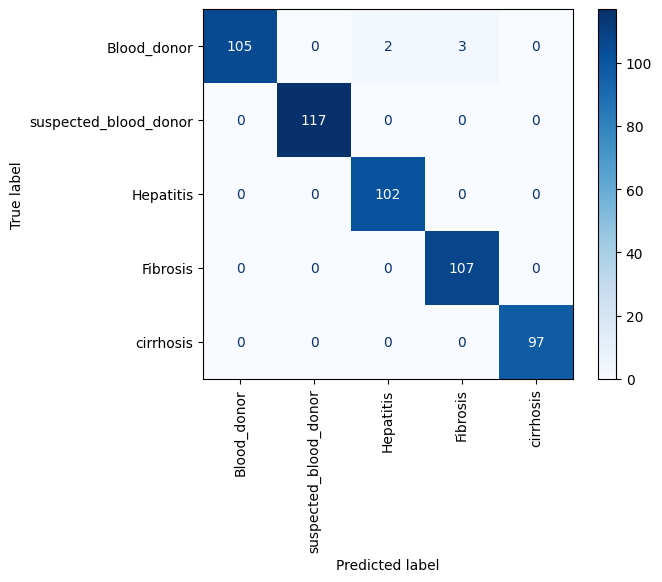

training 0.9759164510862337


In [ ]:
X_train_sel1 = sfs.transform(x_train)
x_test_sel1 = sfs.transform(x_test)
model = KNeighborsClassifier()
model.fit(X_train_sel1, y_train)
y_pred = model.predict(x_test_sel1)
print("accuracy", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
disp = ConfusionMatrixDisplay.from_estimator(model, x_test_sel1, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()


print("training",np.mean(cross_val_score(model, X_train_sel1, y_train, cv=5, scoring='r2')))

###kfold after sbe

In [ ]:
model1 = (model)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, X_train_sel1, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.99297424 0.99063232 0.98356808 0.99765258 0.99061033]
Mean Accuracy: 0.9910875086585085


###roc curve for knn After using sequential backward ele

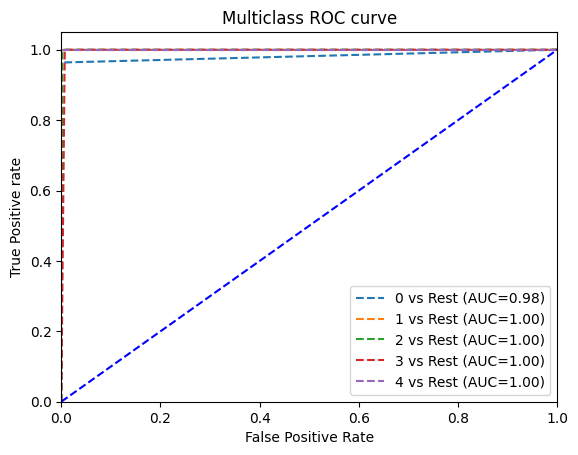

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=model.predict_proba(x_test_sel1)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

###diagram for sequential backward elemination

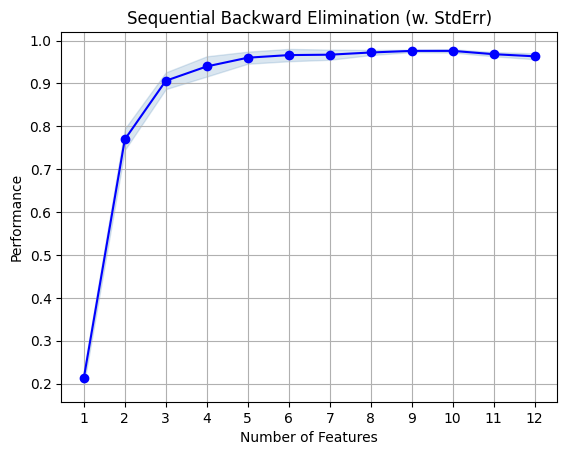

In [ ]:
fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_err',)

plt.title('Sequential Backward Elimination (w. StdErr)')
plt.grid()
plt.show()

###hyper parameter tuning after sbe

1.   List item
2.   List item



In [ ]:
#knnHyperparameter tuning
param={
    "n_neighbors":[1,2,3,4,5,6,7],
    "weights":["uniform","distance"],
    "algorithm":["ball_tree","kd_tree","brute","auto"]



}
grid = RandomizedSearchCV(KNeighborsClassifier(), param_distributions=param,cv=10,n_jobs=-1,scoring='accuracy')
grid.fit(X_train_sel1,y_train)
print("best score : ",grid.best_score_)
print("best param: ",grid.best_params_)

best score :  0.996244131455399
best param:  {'weights': 'distance', 'n_neighbors': 1, 'algorithm': 'auto'}


#**LOGISIC REGRESSION**

In [ ]:
lr =LogisticRegression(multi_class='multinomial',max_iter=1000)
lr.fit(x_train,y_train)
y1_pred=lr.predict(x_test)
print("LogisticRegression model accuracy: ",accuracy_score(y_test,y1_pred))
print("Classification Report:\n", classification_report(y_test, y1_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y1_pred))


LogisticRegression model accuracy:  0.949343339587242
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.95      0.96       110
           1       1.00      1.00      1.00       117
           2       0.89      0.94      0.91       102
           3       0.90      0.88      0.89       107
           4       0.98      0.98      0.98        97

    accuracy                           0.95       533
   macro avg       0.95      0.95      0.95       533
weighted avg       0.95      0.95      0.95       533

Confusion Matrix:
 [[104   0   3   3   0]
 [  0 117   0   0   0]
 [  1   0  96   5   0]
 [  2   0   9  94   2]
 [  0   0   0   2  95]]


##roc for logistic regression

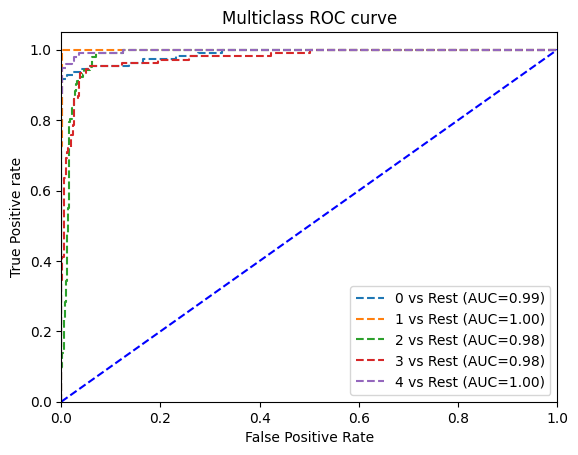

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=lr.predict_proba(x_test)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

##kfold for logistic regression

In [ ]:
# Define the model (replace this with your specific model)
model1 = (lr)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.90398126 0.88758782 0.90375587 0.92723005 0.92018779]
Mean Accuracy: 0.9085485591142483


##backward elemination

In [ ]:
lr1= LogisticRegression(multi_class='multinomial',max_iter=1000)
sfs = SFS(lr1, k_features='best', forward=False, floating=False, scoring='r2',cv=5)

sfs.fit(x_train, y_train)


SequentialFeatureSelector(estimator=LogisticRegression(max_iter=1000,
                                                       multi_class='multinomial'),
                          forward=False, k_features=(1, 12), scoring='r2')

In [ ]:
sfs.k_feature_idx_

(0, 1, 2, 3, 4, 6, 7, 10, 11)

###using sbe model accuracy and training accuracy

accuracy 0.9043151969981238
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.88      0.91       110
           1       0.97      1.00      0.98       117
           2       0.82      0.92      0.87       102
           3       0.85      0.81      0.83       107
           4       0.94      0.90      0.92        97

    accuracy                           0.90       533
   macro avg       0.90      0.90      0.90       533
weighted avg       0.91      0.90      0.90       533

Confusion Matrix:
 [[ 97   4   6   3   0]
 [  0 117   0   0   0]
 [  2   0  94   5   1]
 [  4   0  11  87   5]
 [  0   0   3   7  87]]


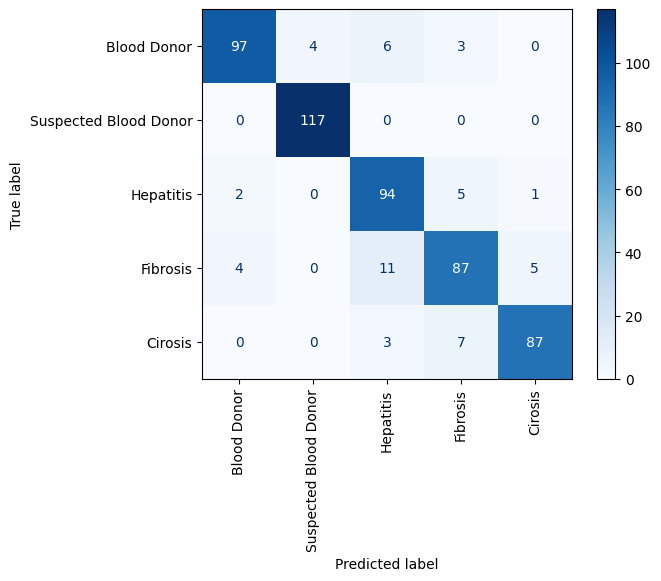

training 0.866752175809213


In [ ]:
X_train_sel2 = sfs.transform(x_train)
x_test_sel2 = sfs.transform(x_test)
model = LogisticRegression(multi_class='ovr', solver='liblinear', max_iter=1000)
model.fit(X_train_sel2, y_train)
y_pred = model.predict(x_test_sel2)
print("accuracy", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
disp = ConfusionMatrixDisplay.from_estimator(model, x_test_sel2, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()

print("training",np.mean(cross_val_score(model, X_train_sel2, y_train, cv=5, scoring='r2')))

###kfold aafter sbe

In [ ]:
model1 = (model)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, X_train_sel2, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.87822014 0.85714286 0.88497653 0.8943662  0.8943662 ]
Mean Accuracy: 0.8818143835691746


###roc after sbe

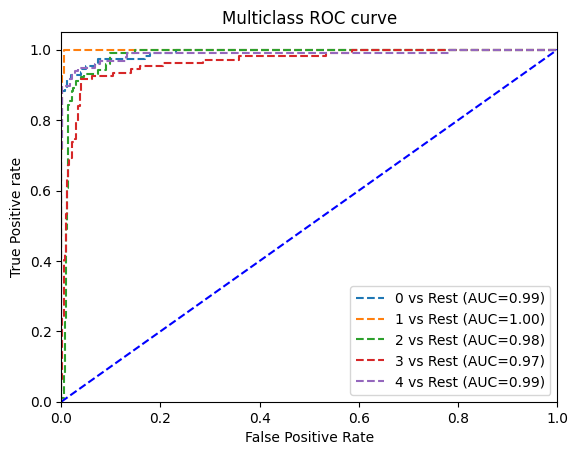

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=model.predict_proba(x_test_sel2)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

###sequential elemination diagram

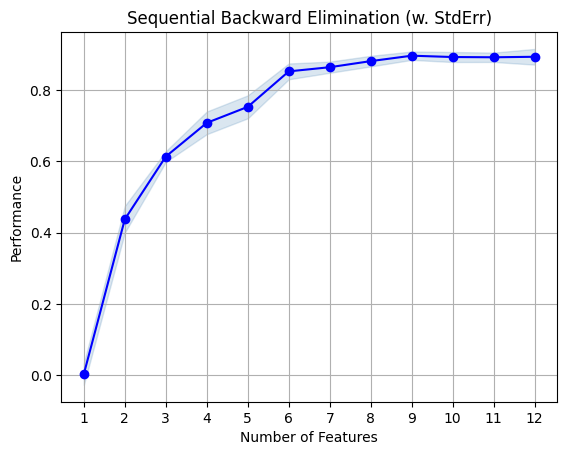

In [ ]:
fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_err',)

plt.title('Sequential Backward Elimination (w. StdErr)')
plt.grid()
plt.show()

In [ ]:
from scipy.stats import loguniform

###hyperparameter tuninng after sbe

In [ ]:
logReg=LogisticRegression(multi_class='multinomial', solver='liblinear',max_iter=1000)
parameters = {
     'C': loguniform(1e-4, 1e2),  # Sample values of 'C' logarithmically between 1e-4 and 100
    'penalty': ['l2', 'none'],  # 'l1' requires solver to be 'liblinear' or 'saga'
    'solver': ['newton-cg', 'lbfgs', 'saga'],
 }
random = RandomizedSearchCV(logReg,param_distributions=parameters,n_jobs=-1,scoring='accuracy')
random.fit(X_train_sel2,y_train)
print("best score : ",random.best_score_)
print("best param: ",random.best_params_)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1183: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1193: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


best score :  0.9090070477509867
best param:  {'C': 43.08775416765416, 'penalty': 'none', 'solver': 'lbfgs'}


#Random forest

In [ ]:
from sklearn.multiclass import OneVsRestClassifier
rf = RandomForestClassifier()
rf.fit(x_train,y_train)
y2_pred= rf.predict(x_test)
print("Random Forest accuracy: ",accuracy_score(y_test,y2_pred))
print("Classification Report:\n", classification_report(y_test, y2_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y2_pred))

Random Forest accuracy:  1.0
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       110
           1       1.00      1.00      1.00       117
           2       1.00      1.00      1.00       102
           3       1.00      1.00      1.00       107
           4       1.00      1.00      1.00        97

    accuracy                           1.00       533
   macro avg       1.00      1.00      1.00       533
weighted avg       1.00      1.00      1.00       533

Confusion Matrix:
 [[110   0   0   0   0]
 [  0 117   0   0   0]
 [  0   0 102   0   0]
 [  0   0   0 107   0]
 [  0   0   0   0  97]]


##roc for random forest

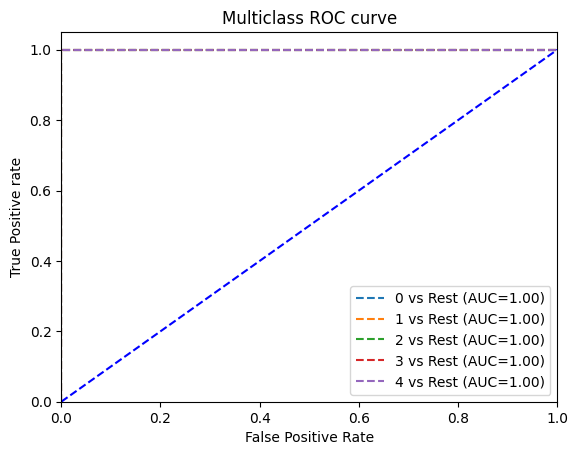

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=rf.predict_proba(x_test)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

##kfold for random forest

In [ ]:
# Define the model (replace this with your specific model)
model1 = (rf)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.99531616 0.99531616 0.99765258 0.99765258 1.        ]
Mean Accuracy: 0.997187496564084


##backward elemination

In [ ]:
rf1= RandomForestClassifier(random_state=42)
sfs = SFS(rf1, k_features='best', forward=False, floating=False, scoring='r2',cv=5)

sfs.fit(x_train, y_train)


SequentialFeatureSelector(estimator=RandomForestClassifier(random_state=42),
                          forward=False, k_features=(1, 12), scoring='r2')

In [ ]:
sfs.k_feature_idx_

(1, 2, 3, 4, 5, 6, 7, 8, 10, 11)

###using sbe finding model accuracy and training accuracy

accuracy 0.99812382739212
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       110
           1       1.00      1.00      1.00       117
           2       1.00      1.00      1.00       102
           3       0.99      1.00      1.00       107
           4       1.00      1.00      1.00        97

    accuracy                           1.00       533
   macro avg       1.00      1.00      1.00       533
weighted avg       1.00      1.00      1.00       533

Confusion Matrix:
 [[109   0   0   1   0]
 [  0 117   0   0   0]
 [  0   0 102   0   0]
 [  0   0   0 107   0]
 [  0   0   0   0  97]]


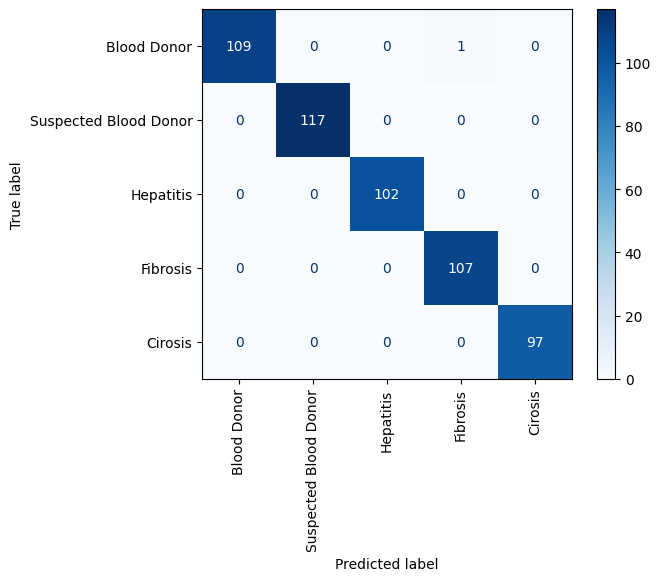

training 0.996960056057684


In [ ]:
X_train_sel3 = sfs.transform(x_train)
x_test_sel3= sfs.transform(x_test)
model = RandomForestClassifier(random_state= 42)
model.fit(X_train_sel3, y_train)
y_pred = model.predict(x_test_sel3)
print("accuracy", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
disp = ConfusionMatrixDisplay.from_estimator(model, x_test_sel3, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()

print("training",np.mean(cross_val_score(model, X_train_sel3, y_train, cv=5, scoring='r2')))

###kfold after sbe

In [ ]:
model1 = (model)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, X_train_sel3, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.99765808 0.99531616 0.99765258 0.99530516 0.99765258]
Mean Accuracy: 0.9967169135028751


###roc curve after sbe

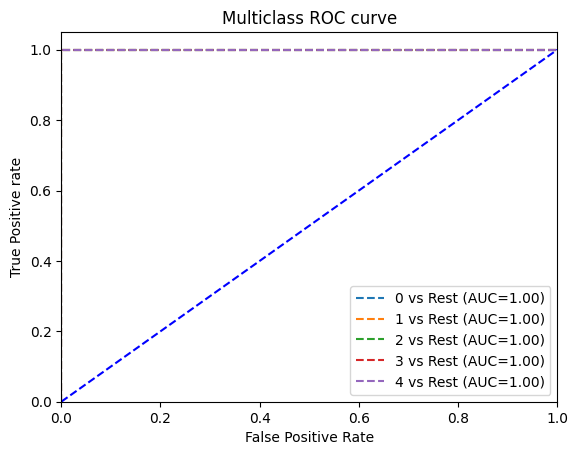

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=model.predict_proba(x_test_sel3)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

###sbe diagram

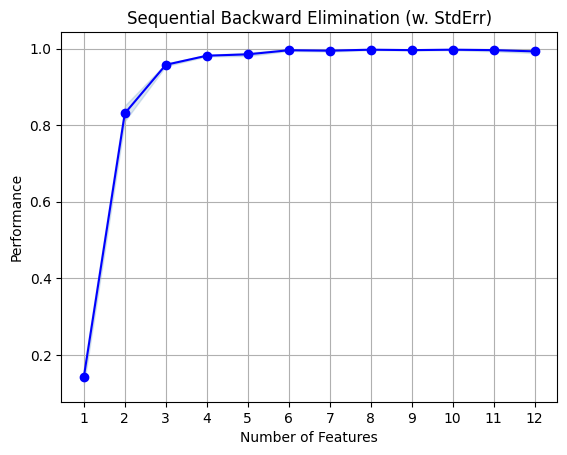

In [ ]:
fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_err',)

plt.title('Sequential Backward Elimination (w. StdErr)')
plt.grid()
plt.show()

###hyper parameter tuning after sbe

In [ ]:
#hyperparameter_tuning
# n_estimators = [20,60,100,120]
# max_features = [0.2,0.6,1.0]
# max_depth=[2,8,None]
# max_samples =[0.5,0.75,1.0]
parameter_grid={
    'n_estimators': [100, 200, 300, 400, 500],  # Number of trees in the forest
    'max_depth': [None, 10, 20, 30, 40, 50],  # Maximum depth of the tree
    'max_samples': [0.5, 0.75, 1.0],  # Maximum number of samples to draw from X to train each base estimator
    'max_features': ['sqrt', 'log2','None'],  # Number of features to consider for the best split
    'bootstrap': [True, False],  # Whether bootstrap samples are used when building trees

}
grid = RandomizedSearchCV(estimator=RandomForestClassifier(),
                    param_distributions=parameter_grid,
                    cv=4,
                    verbose =2,
                    n_jobs =-1)
grid.fit(X_train_sel3,y_train)
print("best score for random forest: ",grid.best_score_)
print("best parameter for random forest ",grid.best_params_)

Fitting 4 folds for each of 10 candidates, totalling 40 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
28 fits failed out of a total of 40.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
16 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1145, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 638, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_

best score for random forest:  0.99812382739212
best parameter for random forest  {'n_estimators': 400, 'max_samples': 1.0, 'max_features': 'log2', 'max_depth': 50, 'bootstrap': True}


#**Adaboost**

In [ ]:
ab=AdaBoostClassifier(algorithm='SAMME')
ab.fit(x_train,y_train)
y3_pred= ab.predict(x_test)
print("adaboost accuracy: ",accuracy_score(y_test,y3_pred))
print("Classification Report:\n", classification_report(y_test, y3_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y3_pred))

adaboost accuracy:  0.8311444652908068
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.97      0.91       110
           1       1.00      0.99      1.00       117
           2       0.67      0.66      0.66       102
           3       0.71      0.67      0.69       107
           4       0.91      0.84      0.87        97

    accuracy                           0.83       533
   macro avg       0.83      0.83      0.83       533
weighted avg       0.83      0.83      0.83       533

Confusion Matrix:
 [[107   0   2   1   0]
 [  1 116   0   0   0]
 [ 10   0  67  19   6]
 [  3   0  30  72   2]
 [  5   0   1  10  81]]


##roc for adaboost

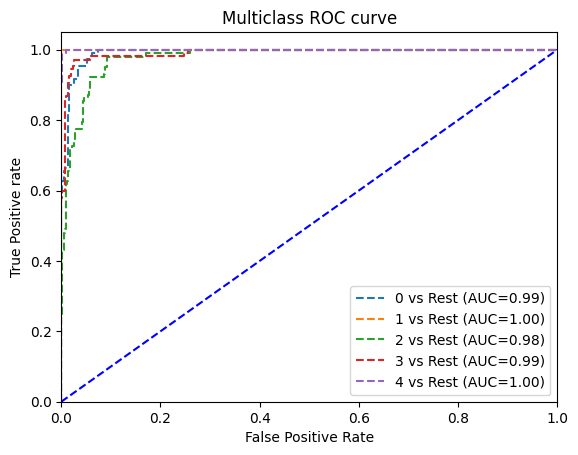

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=ab.predict_proba(x_test)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()

n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

##kfold for adaboost

In [ ]:
# Define the model (replace this with your specific model)
model1 = (ab)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.98360656 0.98594848 0.98826291 1.         0.98826291]
Mean Accuracy: 0.98921617134501


##backward elemination

In [ ]:
ab1= AdaBoostClassifier()
sfs = SFS(ab1, k_features='best', forward=False, floating=False, scoring='r2',cv=5)

sfs.fit(x_train, y_train)


SequentialFeatureSelector(estimator=AdaBoostClassifier(), forward=False,
                          k_features=(1, 12), scoring='r2')

In [ ]:
sfs.k_feature_idx_

(0, 3, 5, 6, 7, 9, 10, 11)

###model and training accuracy after usning sbe

accuracy 0.776735459662289
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.86      0.81       110
           1       0.96      0.56      0.71       117
           2       0.76      0.76      0.76       102
           3       0.83      0.80      0.82       107
           4       0.66      0.92      0.77        97

    accuracy                           0.78       533
   macro avg       0.80      0.78      0.77       533
weighted avg       0.80      0.78      0.77       533

Confusion Matrix:
 [[95  3  9  3  0]
 [ 2 66  6  0 43]
 [17  0 78  7  0]
 [10  0  9 86  2]
 [ 1  0  0  7 89]]


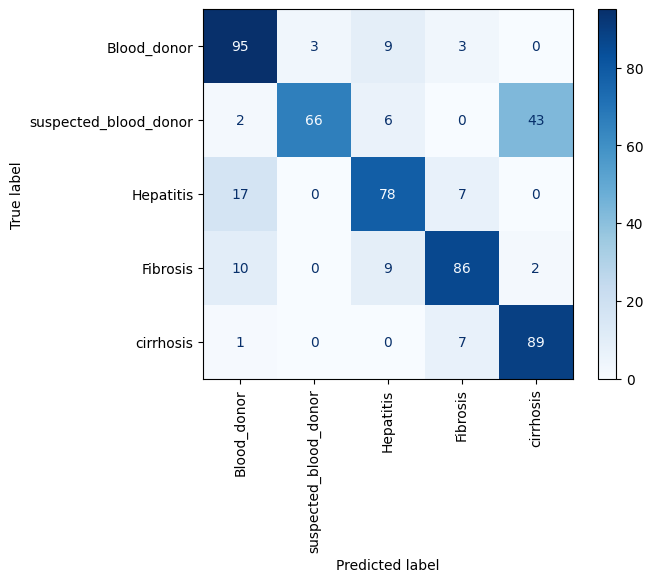

training 0.42675747373926465


In [ ]:
X_train_sel4 = sfs.transform(x_train)
x_test_sel4= sfs.transform(x_test)

model = AdaBoostClassifier(algorithm='SAMME')
#base_estimator=DecisionTreeClassifier(max_depth=1),  # Weak classifier
#n_estimators=50,
model.fit(X_train_sel4, y_train)
y_pred = model.predict(x_test_sel4)
print("accuracy", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
disp = ConfusionMatrixDisplay.from_estimator(model, x_test_sel4, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()

print("training",np.mean(cross_val_score(model, X_train_sel4, y_train, cv=5, scoring='r2')))

###kfold after sbe

In [ ]:
model1 = (model)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, X_train_sel4, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.80562061 0.81030445 0.72769953 0.8028169  0.7370892 ]
Mean Accuracy: 0.7767061384701652


###roc after sbe

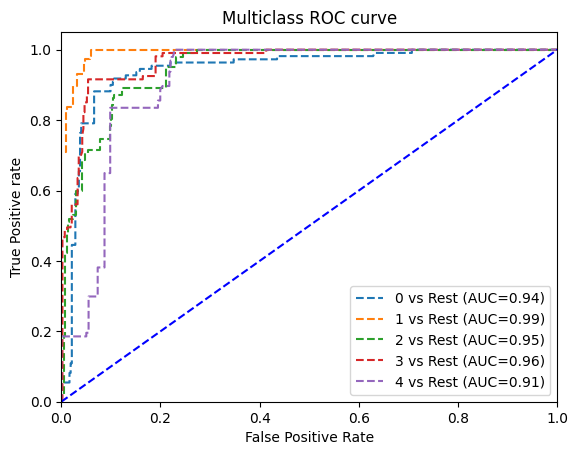

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=model.predict_proba(x_test_sel4)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

###diagram for sbe

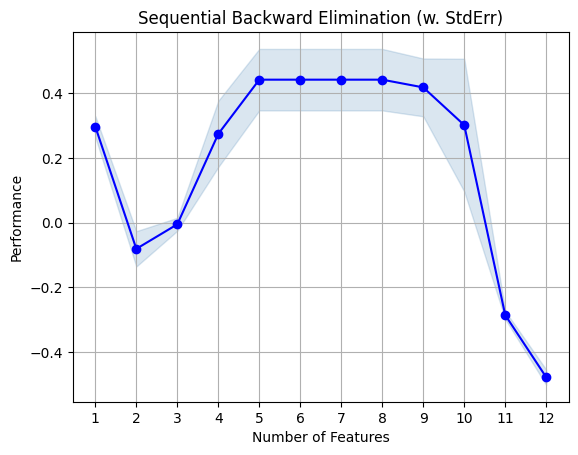

In [ ]:
fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_err',)

plt.title('Sequential Backward Elimination (w. StdErr)')
plt.grid()
plt.show()

###hyper paraqmeter tuninhg after sbe

In [ ]:

from sklearn.ensemble import AdaBoostClassifier
grid = dict()

grid['n_estimators']=[50,100,200,500]
grid['learning_rate']=[0.0001,0.001,0.01,0.1,1.0]
grid['algorithm']=['SAMME','SAMME.R']
base_estimator = DecisionTreeClassifier()

# Define the AdaBoost classifier

grid_s = RandomizedSearchCV(estimator=AdaBoostClassifier(),
param_distributions=grid,n_jobs=-1,cv=4,scoring='accuracy')
grid_s.fit(X_train_sel4,y_train)
print("best score: ",grid_s.best_score_)
print("best parameter for adaboost: ",grid_s.best_params_)

best score:  0.8297373358348968
best parameter for adaboost:  {'n_estimators': 200, 'learning_rate': 0.1, 'algorithm': 'SAMME'}


#**Xgboost**

In [ ]:
xgb_model=xgb.XGBClassifier(objective="multi:softprob", random_state=42)
xgb_model.fit(x_train,y_train)
y4_pred= xgb_model.predict(x_test)
print("Accuracy for xgboost: ",accuracy_score(y_test,y4_pred))
print("Classification Report:\n", classification_report(y_test, y4_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y4_pred))

Accuracy for xgboost:  0.9962476547842402
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.98      0.99       110
           1       0.99      1.00      1.00       117
           2       1.00      1.00      1.00       102
           3       0.99      1.00      1.00       107
           4       1.00      1.00      1.00        97

    accuracy                           1.00       533
   macro avg       1.00      1.00      1.00       533
weighted avg       1.00      1.00      1.00       533

Confusion Matrix:
 [[108   1   0   1   0]
 [  0 117   0   0   0]
 [  0   0 102   0   0]
 [  0   0   0 107   0]
 [  0   0   0   0  97]]


##roc of xgboost

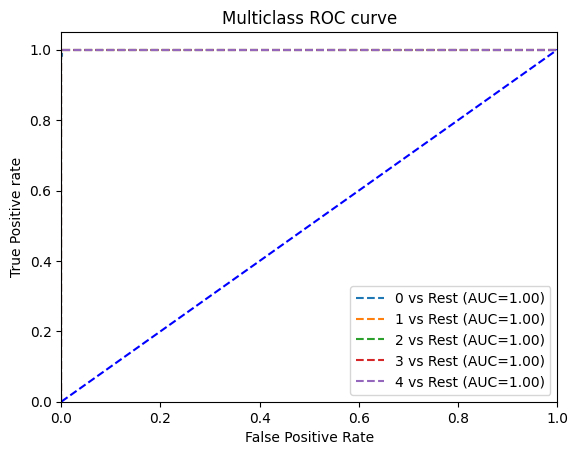

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=xgb_model.predict_proba(x_test)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

##Kfold for xgb

In [ ]:
# Define the model (replace this with your specific model)
model1 = (xgb_model)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.98594848 0.99297424 1.         0.99765258 0.99295775]
Mean Accuracy: 0.9939066090532265


##backward elemination

In [ ]:
xgb1= xgb.XGBClassifier(objective="multi:softprob", random_state=42)
sfs = SFS(xgb1, k_features='best', forward=False, floating=False, scoring='r2',cv=5)

sfs.fit(x_train, y_train)


SequentialFeatureSelector(estimator=XGBClassifier(base_score=None, booster=None,
                                                  callbacks=None,
                                                  colsample_bylevel=None,
                                                  colsample_bynode=None,
                                                  colsample_bytree=None,
                                                  device=None,
                                                  early_stopping_rounds=None,
                                                  enable_categorical=False,
                                                  eval_metric=None,
                                                  feature_types=None,
                                                  gamma=None, grow_policy=None,
                                                  importance_type=None,
                                                  interaction_constraints=None,
                                                  learning_rate=None,
                                                  max_bin=None,
                                                  max_cat_threshold=None,
                                                  max_cat_to_onehot=None,
                                                  max_delta_step=None,
                                                  max_depth=None,
                                                  max_leaves=None,
                                                  min_child_weight=None,
                                                  missing=nan,
                                                  monotone_constraints=None,
                                                  multi_strategy=None,
                                                  n_estimators=None,
                                                  n_jobs=None,
                                                  num_parallel_tree=None,
                                                  objective='multi:softprob', ...),
                          forward=False, k_features=(1, 12), scoring='r2')

In [ ]:
x_train.shape

(2132, 12)

In [ ]:
sfs.k_feature_idx_

(0, 1, 2, 3, 4, 5, 7, 9, 10, 11)

###model and training accuracy after sbe

accuracy 0.9962476547842402
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.98      0.99       110
           1       1.00      1.00      1.00       117
           2       1.00      1.00      1.00       102
           3       0.98      1.00      0.99       107
           4       1.00      1.00      1.00        97

    accuracy                           1.00       533
   macro avg       1.00      1.00      1.00       533
weighted avg       1.00      1.00      1.00       533

Confusion Matrix:
 [[108   0   0   2   0]
 [  0 117   0   0   0]
 [  0   0 102   0   0]
 [  0   0   0 107   0]
 [  0   0   0   0  97]]


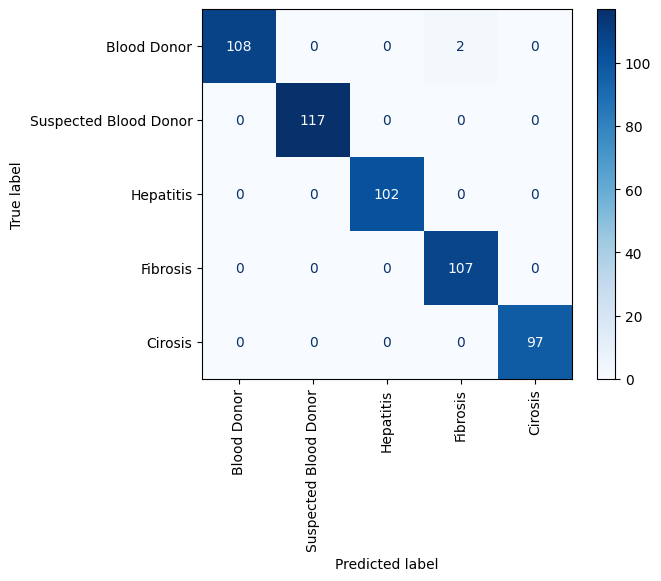

training 0.995322922001939


In [ ]:
X_train_sel5 = sfs.transform(x_train)
x_test_sel5=sfs.transform(x_test)
model = xgb.XGBClassifier(objective="multi:softmax", num_class=5)
model.fit(X_train_sel5, y_train)
y_pred = model.predict(x_test_sel5)
print("accuracy", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
disp = ConfusionMatrixDisplay.from_estimator(model, x_test_sel5, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()

print("training",np.mean(cross_val_score(model, X_train_sel5, y_train, cv=5, scoring='r2')))


In [ ]:
!pip install shap scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 13.3 MB/s eta 0:00:00


###Explainable Ai

In [ ]:
X_train_sel5 = pd.DataFrame(X_train_sel5)

(2132, 10, 5)
(2132, 10)


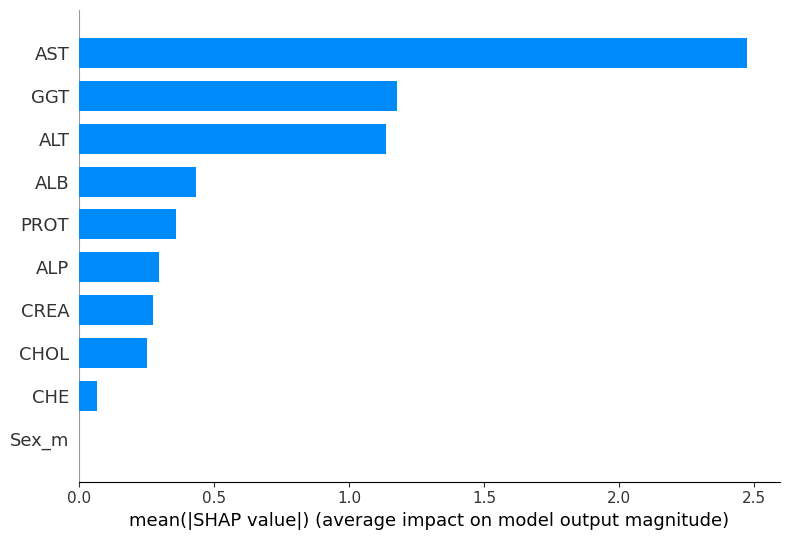

In [ ]:
names1=['ALB','ALP','ALT','CHOL','PROT','Sex_m','AST','CHE','CREA','GGT']
# if isinstance(X_train_sel5, np.ndarray):
#     X_train_sel5 = pd.DataFrame(X_train_sel5, columns=list(names1))

# if isinstance(x_test_sel5, np.ndarray):
#     x_test_sel5 = pd.DataFrame(x_test_sel5, columns=list(names1))
import shap




class_names=['Blood Donor','Suspected Blood Donor','Hepatitis','Fibrosis','Cirosis']
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train_sel5)
print(shap_values.shape)
print(X_train_sel5.shape)

shap.summary_plot(shap_values[:, :, 0], X_train_sel5, plot_type="bar",
                  class_names=class_names, feature_names=names1)


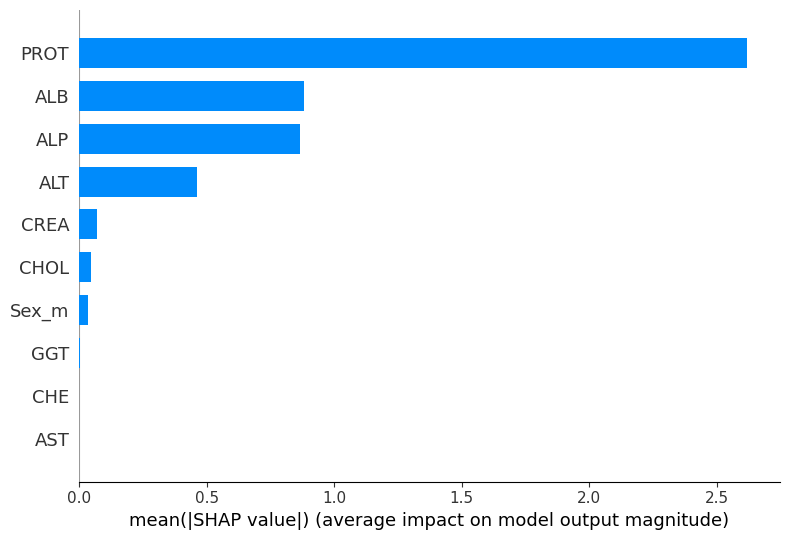

In [ ]:
shap.summary_plot(shap_values[:, :, 1], X_train_sel5, plot_type="bar",
                  class_names=class_names, feature_names=names1)

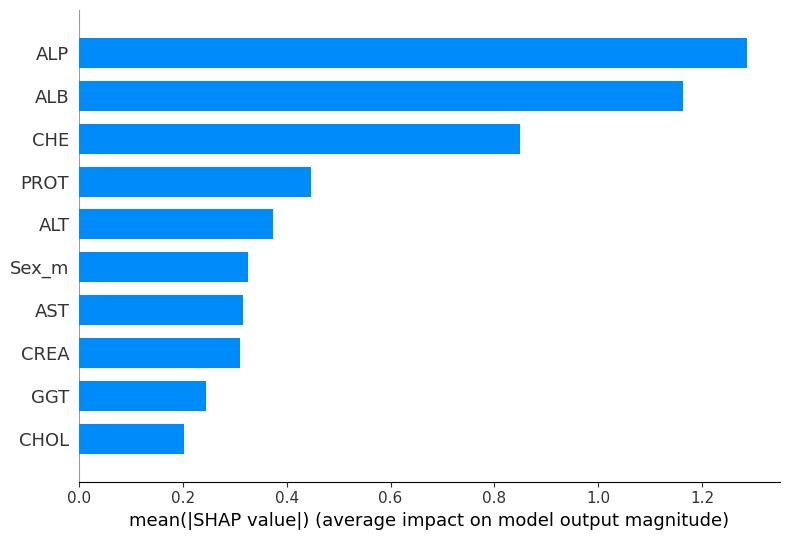

In [ ]:
shap.summary_plot(shap_values[:, :, 2], X_train_sel5, plot_type="bar",
                  class_names=class_names, feature_names=names1)

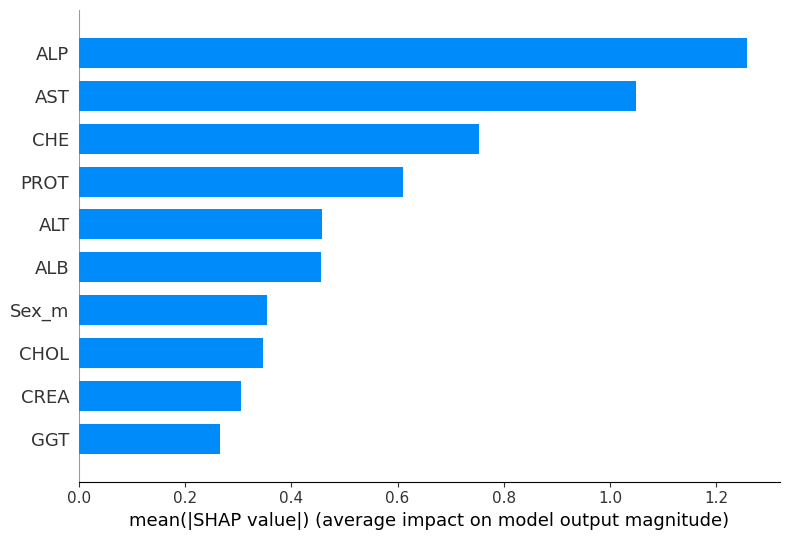

In [ ]:
shap.summary_plot(shap_values[:, :, 3], X_train_sel5, plot_type="bar",
                  class_names=class_names, feature_names=names1)

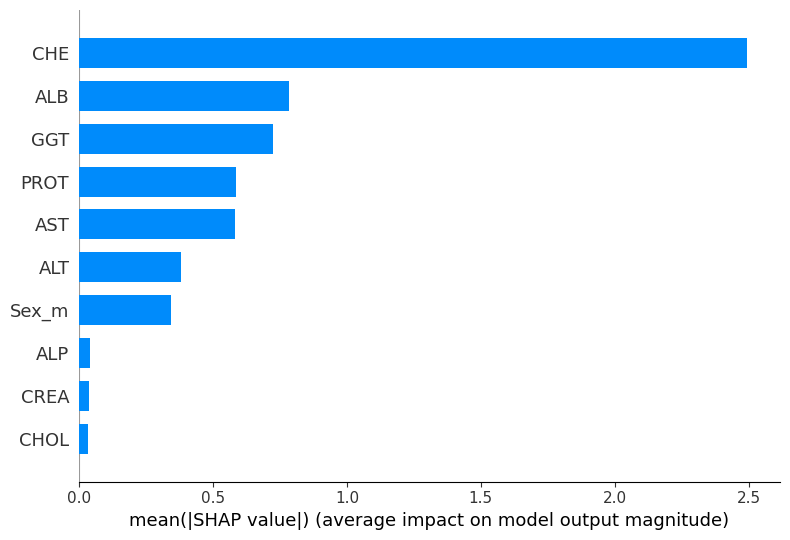

In [ ]:
shap.summary_plot(shap_values[:, :, 4], X_train_sel5, plot_type="bar",
                  class_names=class_names, feature_names=names1)

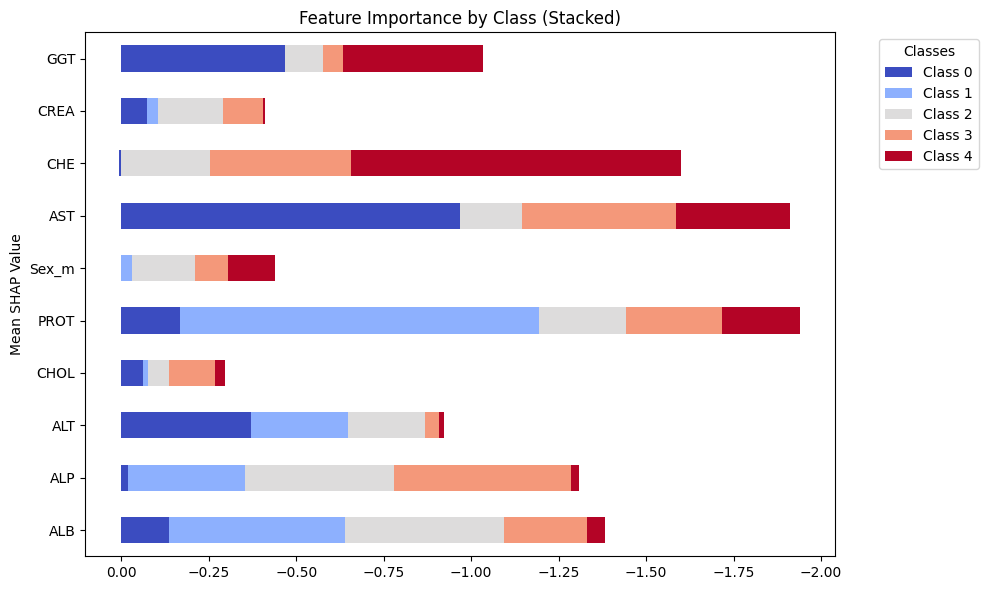

In [ ]:
mean_shap_values = np.mean(shap_values, axis=0)  # Shape (10, 5)

# Create a DataFrame for easy plotting
shap_df = pd.DataFrame(mean_shap_values, columns=[f'Class {i}' for i in range(shap_values.shape[2])])
shap_df['Feature'] =list(names1)

# Plot a stacked bar chart
shap_df.set_index('Feature').plot(kind='barh', stacked=True, figsize=(10, 6), colormap='coolwarm')
plt.gca().invert_xaxis()

# Add labels and title
plt.ylabel('Mean SHAP Value')
plt.title('Feature Importance by Class (Stacked)')
plt.legend(title='Classes', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [ ]:
cls = xgb.XGBClassifier(objective="multi:softmax", num_class=5)
cls.fit(X_train_sel5, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None, num_class=5,
              num_parallel_tree=None, ...)

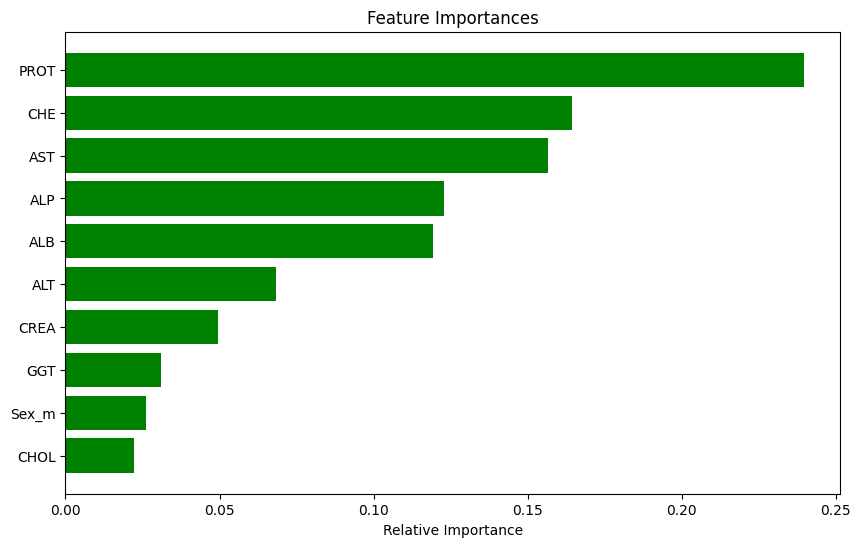

In [ ]:
importances = cls.feature_importances_
indices = np.argsort(importances)
features = X_train_sel5.columns

plt.figure(figsize=(10, 6))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

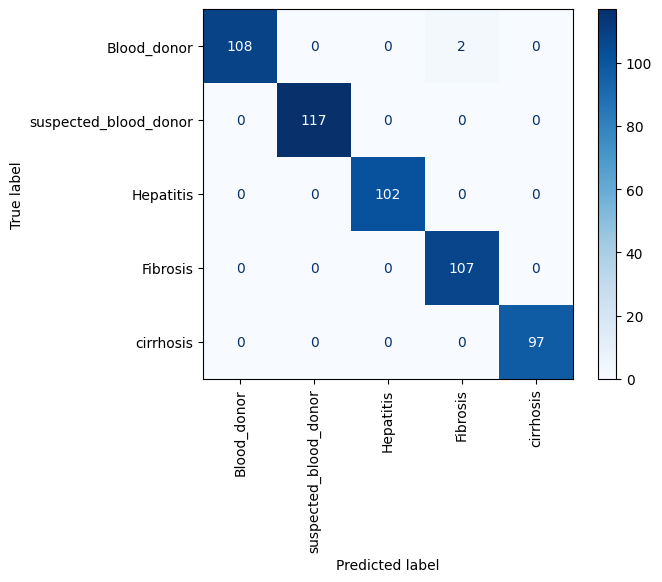

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay


# Assuming 'cls' is your classifier, and 'X_test_sel5' and 'y_test' are your test data.
class_names = ['Blood_donor', 'suspected_blood_donor', 'Hepatitis', 'Fibrosis', 'cirrhosis']

# Get the predicted values
y_pred = cls.predict(x_test_sel5)

# Generate the confusion matrix display
disp = ConfusionMatrixDisplay.from_estimator(cls, x_test_sel5, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
import shap

In [ ]:
!pip install shap

In [ ]:
# compute SHAP values
import shap
explainer = shap.TreeExplainer(cls)
shap_values = explainer.shap_values(X_train_sel5[:2000])

In [ ]:
X_train_sel5.shape

(2132, 10)

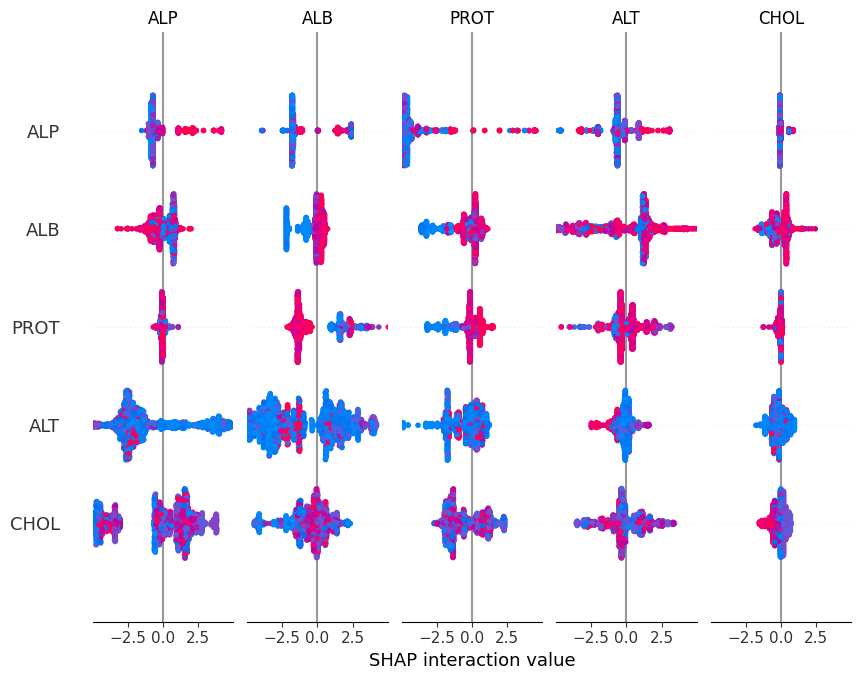

In [ ]:
shap.summary_plot(shap_values, X_train_sel5.values, plot_type="bar", class_names= class_names, feature_names = X_train_sel5.columns)

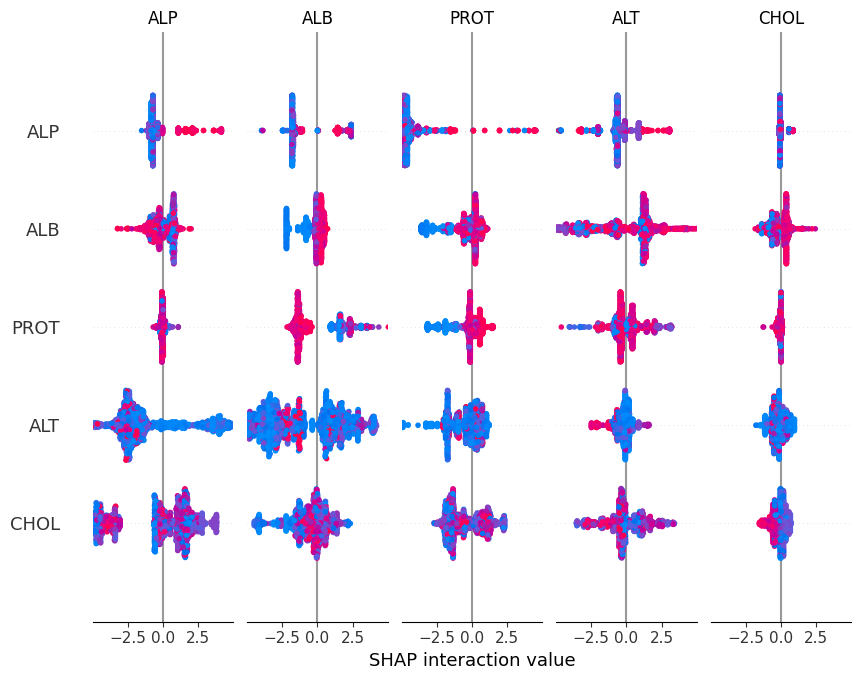

In [ ]:
shap.summary_plot(shap_values, X_train_sel5[:2000], feature_names = x_test_sel5.columns)

In [ ]:
!pip install scikit-learn==1.2.3

ERROR: Could not find a version that satisfies the requirement scikit-learn==1.2.3 (from versions: 0.9, 0.10, 0.11, 0.12, 0.12.1, 0.13, 0.13.1, 0.14, 0.14.1, 0.15.0, 0.15.1, 0.15.2, 0.16.0, 0.16.1, 0.17, 0.17.1, 0.18, 0.18.1, 0.18.2, 0.19.0, 0.19.1, 0.19.2, 0.20.0, 0.20.1, 0.20.2, 0.20.3, 0.20.4, 0.21.1, 0.21.2, 0.21.3, 0.22, 0.22.1, 0.22.2.post1, 0.23.0, 0.23.1, 0.23.2, 0.24.0, 0.24.1, 0.24.2, 1.0, 1.0.1, 1.0.2, 1.1.0, 1.1.1, 1.1.2, 1.1.3, 1.2.0rc1, 1.2.0, 1.2.1, 1.2.2, 1.3.0rc1, 1.3.0, 1.3.1, 1.3.2, 1.4.0rc1, 1.4.0, 1.4.1.post1, 1.4.2, 1.5.0rc1, 1.5.0, 1.5.1)
ERROR: No matching distribution found for scikit-learn==1.2.3


In [ ]:
y_train.value_counts()

,count
0,
4,436
2,431
3,426
0,423
1,416


In [ ]:
combined_data

,ALB,ALP,ALT,CHOL,PROT,Sex_m,AST,CHE,CREA,GGT,0
0,0.712904,-1.216586,-0.699038,0.119918,-0.510546,0.855800,-0.083636,0.722577,-0.006159,-0.140068,0.0
1,-0.266668,-0.072995,3.785765,-1.384849,1.730356,0.855800,0.833396,-0.157596,-0.171898,0.868408,0.0
2,0.879971,-1.577305,-0.285617,-1.119746,0.144781,0.855800,1.902093,-0.400976,-0.258631,0.441564,0.0
3,-2.467387,0.935545,-0.438042,-1.621788,-0.142549,-1.168497,0.477975,-2.727860,-0.419830,0.144585,0.0
4,-0.476444,-0.072995,0.658812,-1.054910,1.217969,-1.168497,0.034868,0.318812,0.045665,0.845266,0.0
...,...,...,...,...,...,...,...,...,...,...,...
3514,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0
3515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0
3516,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0
3517,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0


###kfold after sbe

In [ ]:
model1 = (model)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, X_train_sel5, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.98594848 0.99531616 1.         1.         0.99295775]
Mean Accuracy: 0.994844476696243


###roc after sbe

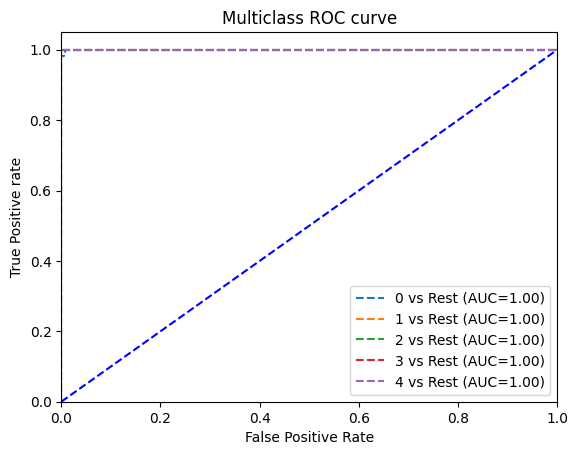

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=model.predict_proba(x_test_sel5)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

###diagram after sbe

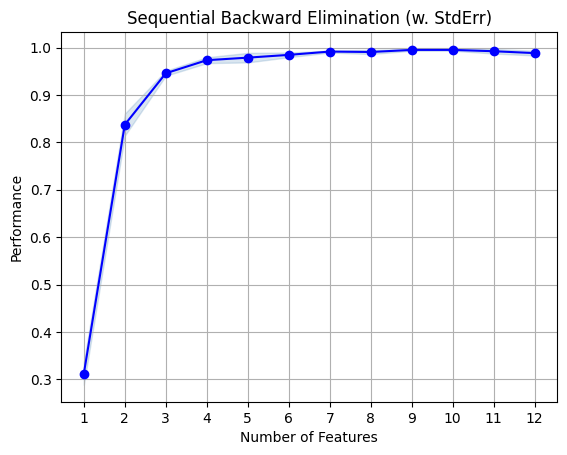

In [ ]:
fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_err',)

plt.title('Sequential Backward Elimination (w. StdErr)')
plt.grid()
plt.show()

###randomised hyperparameter tuninig after sbe

In [ ]:
#xgb_hyperparameterTuning
params ={
    "learning_rate": [0.01, 0.1, 0.2, 0.3],  # Controls how much to adjust the weights
    "n_estimators": [100, 200, 300, 500],  # Number of boosting rounds
    "max_depth": [3, 5, 7, 9],  # Maximum depth of each tree
    "colsample_bytree": [0.3, 0.5, 0.7, 1]  # Fraction of features to consider for each tree

}
g_search=RandomizedSearchCV(estimator=xgb.XGBClassifier(), param_distributions=params,n_jobs=-1,cv=4,scoring='accuracy')
g_search.fit(X_train_sel5,y_train)
y_pred = g_search.predict(x_test_sel5)
print("accuracy", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("best parameter for xgb: ",g_search.best_params_)
print("best score for xgb using hyper parameter ",g_search.best_score_)

accuracy 0.99812382739212
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       110
           1       1.00      1.00      1.00       117
           2       1.00      1.00      1.00       102
           3       0.99      1.00      1.00       107
           4       1.00      1.00      1.00        97

    accuracy                           1.00       533
   macro avg       1.00      1.00      1.00       533
weighted avg       1.00      1.00      1.00       533

Confusion Matrix:
 [[109   0   0   1   0]
 [  0 117   0   0   0]
 [  0   0 102   0   0]
 [  0   0   0 107   0]
 [  0   0   0   0  97]]
best parameter for xgb:  {'n_estimators': 500, 'max_depth': 7, 'learning_rate': 0.1, 'colsample_bytree': 0.5}
best score for xgb using hyper parameter  0.9957786116322702


### grid search after using sbe

In [ ]:
from sklearn.model_selection import GridSearchCV


# Define the parameter grid
params = {
    "learning_rate": [0.01, 0.1, 0.2, 0.3],  # Controls how much to adjust the weights
    "n_estimators": [100, 200, 300, 500],    # Number of boosting rounds
    "max_depth": [3, 5, 7, 9],# Maximum depth of each tree

}

# Initialize the GridSearchCV
g_search = GridSearchCV(estimator=xgb.XGBClassifier(),
                        param_grid=params,
                        cv=2,             # 4-fold cross-validation
                        scoring='accuracy',
                        n_jobs=-1)
# Fit the model
g_search.fit(X_train_sel5, y_train)

# Predict on the test set
y_pred = g_search.predict(x_test_sel5)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


# Output the best parameters and score
print("Best parameters for XGBoost: ", g_search.best_params_)
print("Best score for XGBoost: ", g_search.best_score_)


Accuracy: 0.9962476547842402
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.98      0.99       110
           1       1.00      1.00      1.00       117
           2       0.99      1.00      1.00       102
           3       0.99      1.00      1.00       107
           4       1.00      1.00      1.00        97

    accuracy                           1.00       533
   macro avg       1.00      1.00      1.00       533
weighted avg       1.00      1.00      1.00       533

Confusion Matrix:
 [[108   0   1   1   0]
 [  0 117   0   0   0]
 [  0   0 102   0   0]
 [  0   0   0 107   0]
 [  0   0   0   0  97]]
Best parameters for XGBoost:  {'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 200}
Best score for XGBoost:  0.9939024390243902


###optuna after using sbe

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 362.8/362.8 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.0/233.0 kB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 4.7 MB/s eta 0:00:00


In [ ]:
import optuna


# Objective function for Optuna
def objective(trial):
    param = {
        'learning_rate': trial.suggest_float('learning_rate',0.01, 0.3),
        'n_estimators': trial.suggest_int('n_estimators', 100,500),
        'max_depth': trial.suggest_int('max_depth', 3, 9)

    }

    # Train model with suggested hyperparameters
    model = xgb.XGBClassifier(**param)
    model.fit(X_train_sel5, y_train)

    # Predict and evaluate
    preds = model.predict(x_test_sel5)
    accuracy = accuracy_score(y_test, preds)

    return accuracy

# Create a study object and optimize
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)  # Perform 50 trials

# Print the best trial and corresponding parameters
print("Best parameters found by Optuna: ", study.best_trial.params)
print("Best accuracy achieved: ", study.best_trial.value)

best_params = study.best_trial.params
final_model = xgb.XGBClassifier(**best_params)
final_model.fit(X_train_sel5, y_train)

# Predict on the test set
y_pred = final_model.predict(x_test_sel5)

# Accuracy score
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy after hyperparameter tuning: {accuracy:.4f}")

# Classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)


[I 2024-09-10 12:35:01,084] A new study created in memory with name: no-name-7e73fb74-fd4f-4712-8a5f-9cc8ed3de2ea
[I 2024-09-10 12:35:08,013] Trial 0 finished with value: 0.9943714821763602 and parameters: {'learning_rate': 0.07322224092115033, 'n_estimators': 320, 'max_depth': 7}. Best is trial 0 with value: 0.9943714821763602.
[I 2024-09-10 12:35:09,842] Trial 1 finished with value: 0.9962476547842402 and parameters: {'learning_rate': 0.1718852275589135, 'n_estimators': 428, 'max_depth': 4}. Best is trial 1 with value: 0.9962476547842402.
[I 2024-09-10 12:35:10,820] Trial 2 finished with value: 0.9962476547842402 and parameters: {'learning_rate': 0.26879322159214686, 'n_estimators': 110, 'max_depth': 4}. Best is trial 1 with value: 0.9962476547842402.
[I 2024-09-10 12:35:12,772] Trial 3 finished with value: 0.9962476547842402 and parameters: {'learning_rate': 0.13049091459637266, 'n_estimators': 260, 'max_depth': 6}. Best is trial 1 with value: 0.9962476547842402.
[I 2024-09-10 12:35

Best parameters found by Optuna:  {'learning_rate': 0.21846292441093568, 'n_estimators': 360, 'max_depth': 4}
Best accuracy achieved:  0.99812382739212
Accuracy after hyperparameter tuning: 0.9981
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       110
           1       1.00      1.00      1.00       117
           2       1.00      1.00      1.00       102
           3       0.99      1.00      1.00       107
           4       1.00      1.00      1.00        97

    accuracy                           1.00       533
   macro avg       1.00      1.00      1.00       533
weighted avg       1.00      1.00      1.00       533



###GNN

In [ ]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117


Looking in indexes: https://download.pytorch.org/whl/cu117


In [ ]:
!pip install torch-scatter -f https://data.pyg.org/whl/torch-$(python -c "import torch; print(torch.__version__)").html
!pip install torch-sparse -f https://data.pyg.org/whl/torch-$(python -c "import torch; print(torch.__version__)").html
!pip install torch-geometric
import torch_geometric
print(torch_geometric.__version__)


Looking in links: https://data.pyg.org/whl/torch-2.5.1+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 89.2 MB/s eta 0:00:00
Looking in links: https://data.pyg.org/whl/torch-2.5.1+cu121.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 15.6 MB/s eta 0:00:00
2.6.1


In [ ]:
from sklearn.neighbors import kneighbors_graph
import torch
from torch_geometric.data import Data
import torch.nn.functional as F
from torch_geometric.nn import GCNConv

# Create the adjacency matrix using k-nearest neighbors (KNN)
adj_matrix = kneighbors_graph(X_train_sel5, n_neighbors=5, mode='connectivity', include_self=False)

# Convert adjacency matrix to edge_index format required by PyTorch Geometric
edge_index = torch.tensor(adj_matrix.nonzero(), dtype=torch.long)

# Convert the feature matrix and labels to PyTorch tensors
x = torch.tensor(X_train_sel5, dtype=torch.float)
y = torch.tensor(y_train, dtype=torch.long)

# Create a PyTorch Geometric Data object
data = Data(x=x, edge_index=edge_index, y=y)

print(data)

class GCN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

# Define model parameters
in_channels = X_train_sel5.shape[1]  # Number of features after SFS
hidden_channels = 16
out_channels = len(set(y_train))  # Number of classes in the dataset
print("out channels", out_channels)

# Initialize the GCN model
model = GCN(in_channels=in_channels, hidden_channels=hidden_channels, out_channels=out_channels)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
criterion = torch.nn.CrossEntropyLoss()

# Training the model
model.train()
for epoch in range(200):
    optimizer.zero_grad()
    out = model(data)  # Forward pass
    loss = criterion(out, data.y)  # Supervised learning, using the ground truth labels
    loss.backward()
    optimizer.step()

    if epoch % 10 == 0:
        print(f'Epoch {epoch+1}, Loss: {loss.item()}')
# Create KNN graph for the test set
adj_matrix_test = kneighbors_graph(x_test_sel5, n_neighbors=5, mode='connectivity', include_self=False)
edge_index_test = torch.tensor(adj_matrix_test.nonzero(), dtype=torch.long)

# Create PyTorch Geometric Data object for test data
x_test = torch.tensor(x_test_sel5, dtype=torch.float)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.long)
test_data = Data(x=x_test, edge_index=edge_index_test, y=y_test_tensor)

# Evaluate the model
model.eval()
with torch.no_grad():
    test_out = model(test_data)
    predicted = test_out.argmax(dim=1)

# Calculate accuracy or any other metrics
correct = (predicted == test_data.y).sum().item()
accuracy = correct / test_data.num_nodes
print(f'Accuracy: {accuracy:.4f}')



<ipython-input-28-e0b0f8ee2305>:11: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:278.)
  edge_index = torch.tensor(adj_matrix.nonzero(), dtype=torch.long)


Data(x=[2132, 10], edge_index=[2, 10660], y=[2132])
out channels 5
Epoch 1, Loss: 2.5536792278289795
Epoch 11, Loss: 1.1993470191955566
Epoch 21, Loss: 0.8586709499359131
Epoch 31, Loss: 0.6681984663009644
Epoch 41, Loss: 0.5295224785804749
Epoch 51, Loss: 0.43138888478279114
Epoch 61, Loss: 0.3671020567417145
Epoch 71, Loss: 0.3170558512210846
Epoch 81, Loss: 0.27948006987571716
Epoch 91, Loss: 0.2515544593334198
Epoch 101, Loss: 0.22962144017219543
Epoch 111, Loss: 0.21187248826026917
Epoch 121, Loss: 0.1969185769557953
Epoch 131, Loss: 0.18425020575523376
Epoch 141, Loss: 0.17325767874717712
Epoch 151, Loss: 0.163070946931839
Epoch 161, Loss: 0.1538553684949875
Epoch 171, Loss: 0.14547519385814667
Epoch 181, Loss: 0.1376902312040329
Epoch 191, Loss: 0.1298971325159073
Accuracy: 0.9362


Accuracy: 0.9362
Classification Report:
                       precision    recall  f1-score   support

          Blood Donor     0.9369    0.9455    0.9412       110
Suspected Blood Donor     1.0000    1.0000    1.0000       117
            Hepatitis     0.9485    0.9020    0.9246       102
             Fibrosis     0.8762    0.8598    0.8679       107
              Cirosis     0.9126    0.9691    0.9400        97

             accuracy                         0.9362       533
            macro avg     0.9348    0.9353    0.9347       533
         weighted avg     0.9364    0.9362    0.9360       533

Confusion Matrix:


<Figure size 800x800 with 0 Axes>

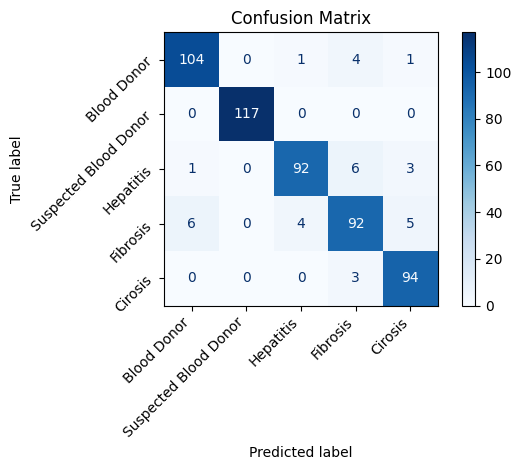

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt


# Evaluate the model
model.eval()
with torch.no_grad():
    test_out = model(test_data)
    predicted = test_out.argmax(dim=1)

# Calculate metrics
correct = (predicted == test_data.y).sum().item()
accuracy = correct / test_data.num_nodes

# Convert tensors to numpy for compatibility with sklearn
y_true = test_data.y.numpy()
y_pred = predicted.numpy()

# Print accuracy
print(f'Accuracy: {accuracy:.4f}')

# Print precision, recall, and F1-score
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

# Confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)

# Display the confusion matrix
print("Confusion Matrix:")
plt.figure(figsize=(8, 8))
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix")

# Rotate the x-axis and y-axis labels
plt.xticks(rotation=45, ha='right')  # Rotate the x-axis labels
plt.yticks(rotation=45, ha='right')  # Rotate the y-axis labels
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()



In [ ]:
# edge_index is the adjacency list in torch_geometric's Data format
print("Edge Index Shape:", edge_index.shape)
print("Edge Index:", edge_index)


Edge Index Shape: torch.Size([2, 10660])
Edge Index: tensor([[   0,    0,    0,  ..., 2131, 2131, 2131],
        [1812,  238, 1405,  ...,  889,  316, 1953]])


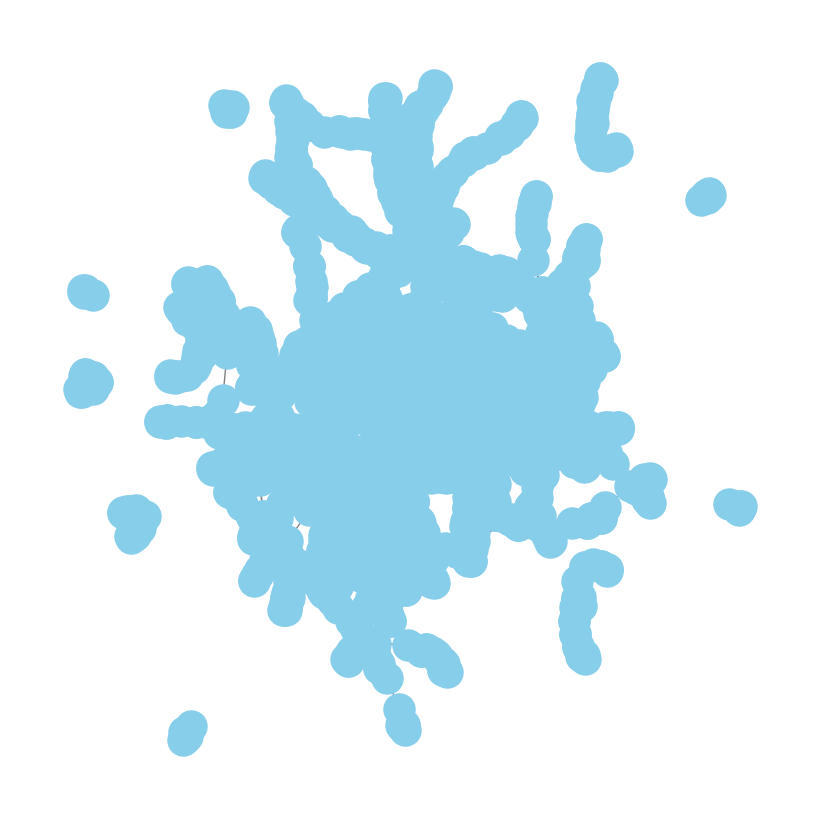

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Convert edge_index to NetworkX graph
edge_index_np = edge_index.numpy()  # Convert from PyTorch tensor to NumPy array
G = nx.Graph()

# Add edges to the graph
for i in range(edge_index_np.shape[1]):
    G.add_edge(edge_index_np[0, i], edge_index_np[1, i])

# Visualize the graph using matplotlib
plt.figure(figsize=(8, 8))
nx.draw(G, with_labels=False, node_size=500, node_color='skyblue', edge_color='gray')
plt.show()


#**Decision Tree**

In [ ]:

dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)
y5_pred=dt.predict(x_test)
print("accuracy for Decsion Tree: ",accuracy_score(y_test, y5_pred))
print("Classification Report:\n", classification_report(y_test, y5_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y5_pred))

accuracy for Decsion Tree:  0.9699812382739212
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.91      0.95       110
           1       0.97      1.00      0.98       117
           2       0.96      0.97      0.97       102
           3       0.95      0.99      0.97       107
           4       0.98      0.98      0.98        97

    accuracy                           0.97       533
   macro avg       0.97      0.97      0.97       533
weighted avg       0.97      0.97      0.97       533

Confusion Matrix:
 [[100   4   3   2   1]
 [  0 117   0   0   0]
 [  0   0  99   3   0]
 [  0   0   0 106   1]
 [  0   0   1   1  95]]


##ROC for decision treee

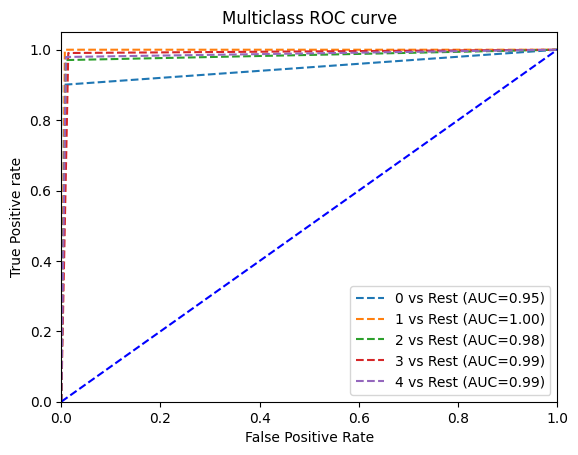

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=dt.predict_proba(x_test)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

##kfold for decisiontree

In [ ]:
# Define the model (replace this with your specific model)
model1 = (dt)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.97189696 0.97892272 0.98591549 0.98591549 0.9741784 ]
Mean Accuracy: 0.9793658123605018


##wrapper ,sequential backward elemination for decision treee

In [ ]:
dt1= DecisionTreeClassifier()
sfs = SFS(dt1, k_features='best', forward=False, floating=False, scoring='r2',cv=5)

sfs.fit(x_train, y_train)

SequentialFeatureSelector(estimator=DecisionTreeClassifier(), forward=False,
                          k_features=(1, 12), scoring='r2')

In [ ]:
sfs.k_feature_idx_

(0, 1, 2, 3, 6, 7, 8, 10, 11)

###model and training accuracy after sbe

accuracy 0.9812382739212008
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.93      0.96       110
           1       0.98      1.00      0.99       117
           2       0.96      1.00      0.98       102
           3       0.99      0.98      0.99       107
           4       0.97      1.00      0.98        97

    accuracy                           0.98       533
   macro avg       0.98      0.98      0.98       533
weighted avg       0.98      0.98      0.98       533

Confusion Matrix:
 [[102   2   3   1   2]
 [  0 117   0   0   0]
 [  0   0 102   0   0]
 [  0   0   1 105   1]
 [  0   0   0   0  97]]


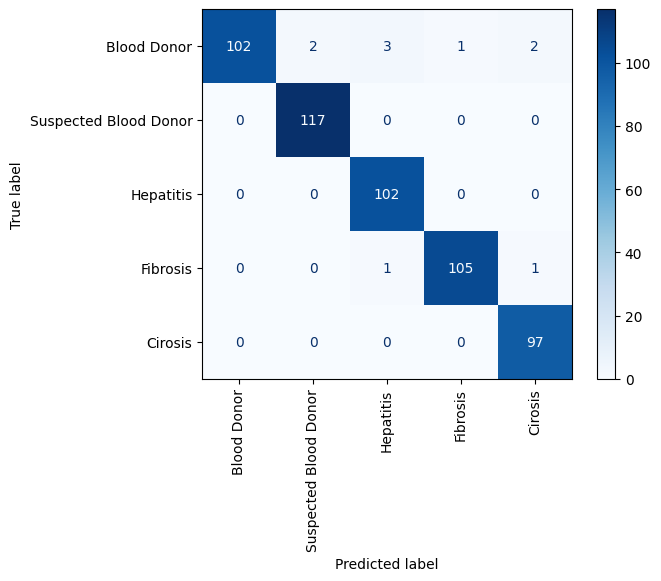

In [ ]:
X_train_sel6 = sfs.transform(x_train)
x_test_sel6=sfs.transform(x_test)
model = DecisionTreeClassifier()
model.fit(X_train_sel6, y_train)
y_pred = model.predict(x_test_sel6)
print("accuracy", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
disp = ConfusionMatrixDisplay.from_estimator(model, x_test_sel6, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()


###kfold after sbe

In [ ]:
model1 = (model)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, X_train_sel6, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.98360656 0.96955504 0.98826291 0.98826291 0.98591549]
Mean Accuracy: 0.9831205814119691


###roc after sbe

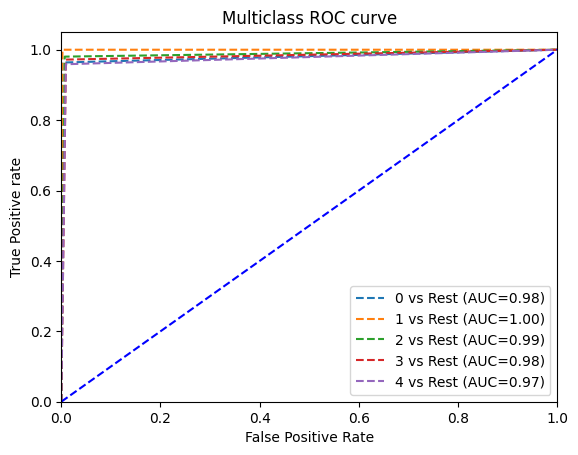

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=model.predict_proba(x_test_sel6)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

###sbe diagram

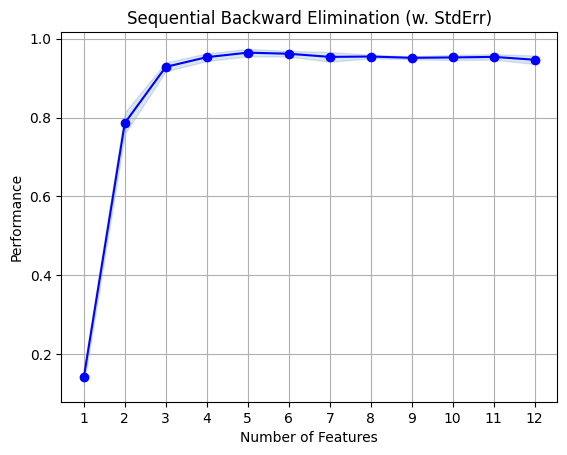

In [ ]:
fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_err',)

plt.title('Sequential Backward Elimination (w. StdErr)')
plt.grid()
plt.show()

###hyperparameter tuning after sbe

In [ ]:
##hyperParameterTuning for Decision Treeee
param={
    'criterion': ['gini', 'entropy'],  # Criterion to measure the quality of a split
    'max_depth': np.arange(1, 20),     # Maximum depth of the tree
    'min_samples_split': np.arange(2, 10),  # Minimum samples required to split a node
    'min_samples_leaf': np.arange(1, 10),   # Minimum samples required at a leaf node
    'max_features': [None, 'auto', 'sqrt', 'log2']
}
grid = RandomizedSearchCV(DecisionTreeClassifier(),param_distributions=param,cv=4,scoring="accuracy",n_jobs=-1)
grid.fit(X_train_sel6,y_train)
print("best score after using hyper parameter tuning : ",grid.best_score_)
print("best param for dt is: ",grid.best_params_)

best score after using hyper parameter tuning :  0.9727954971857411
best param for dt is:  {'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': None, 'max_depth': 16, 'criterion': 'gini'}


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
4 fits failed out of a total of 40.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1145, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 638, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_pa

#**Applying svm**

In [ ]:
from sklearn.svm import SVC
# Initialize the SVM classifier
model = SVC(probability=True)  # You can choose different kernels (linear, rbf, poly, etc.)

# Train the classifier on the training set
model.fit(x_train, y_train)

# Make predictions on the test set
y6_pred = model.predict(x_test)

# Evaluate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')
print("Classification Report:\n", classification_report(y_test, y6_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y6_pred))

Accuracy: 0.9887429643527205
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.98      0.99       110
           1       1.00      1.00      1.00       117
           2       0.99      0.95      0.97       102
           3       0.93      1.00      0.96       107
           4       1.00      0.97      0.98        97

    accuracy                           0.98       533
   macro avg       0.98      0.98      0.98       533
weighted avg       0.98      0.98      0.98       533

Confusion Matrix:
 [[108   0   1   1   0]
 [  0 117   0   0   0]
 [  1   0  97   4   0]
 [  0   0   0 107   0]
 [  0   0   0   3  94]]


##ROC for SVM

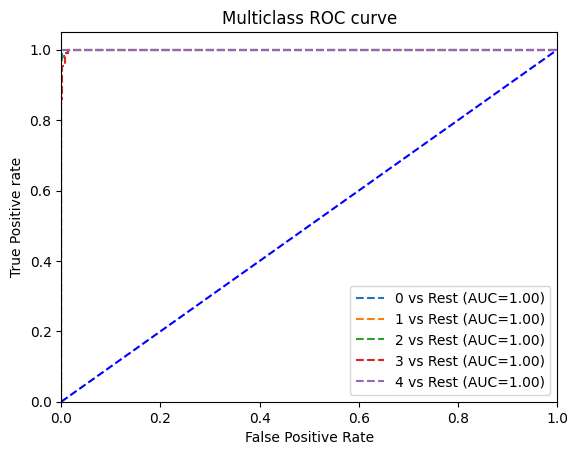

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=model.predict_proba(x_test)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

##kfold for svm

In [ ]:
# Define the model (replace this with your specific model)
model1 = (model)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.95784543 0.96487119 0.96244131 0.96713615 0.96244131]
Mean Accuracy: 0.9629470813954768


##Backward

In [ ]:
svm1= SVC(kernel='linear',probability=True)
sfs = SFS(svm1, k_features='best', forward=False, floating=False, scoring='r2',cv=5)

sfs.fit(x_train, y_train)

SequentialFeatureSelector(estimator=SVC(kernel='linear', probability=True),
                          forward=False, k_features=(1, 12), scoring='r2')

In [ ]:
sfs.k_feature_idx_

(0, 1, 3, 4, 6, 7, 8, 9, 11)

###model and training accuracy after sbe

accuracy 0.9530956848030019
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.95      0.96       110
           1       0.99      1.00      1.00       117
           2       0.90      0.94      0.92       102
           3       0.90      0.93      0.91       107
           4       1.00      0.95      0.97        97

    accuracy                           0.95       533
   macro avg       0.95      0.95      0.95       533
weighted avg       0.95      0.95      0.95       533

Confusion Matrix:
 [[104   1   3   2   0]
 [  0 117   0   0   0]
 [  2   0  96   4   0]
 [  0   0   8  99   0]
 [  0   0   0   5  92]]


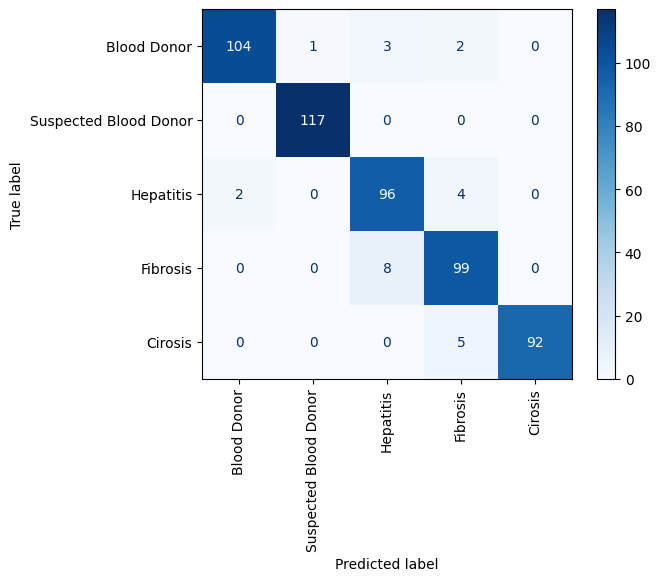

training 0.938047115272518


In [ ]:
X_train_sel7 = sfs.transform(x_train)
x_test_sel7=sfs.transform(x_test)
model = SVC(kernel='linear',probability=True)
model.fit(X_train_sel7, y_train)
y_pred = model.predict(x_test_sel7)
print("accuracy", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
disp = ConfusionMatrixDisplay.from_estimator(model, x_test_sel7, y_test, display_labels=class_names, cmap=plt.cm.Blues)

# Rotate x-tick labels
plt.xticks(rotation='vertical')
plt.show()

print("training",np.mean(cross_val_score(model, X_train_sel7, y_train, cv=5, scoring='r2')))


###kfold after sbe

In [ ]:
model1 = (model)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(model1, X_train_sel7, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.93442623 0.93208431 0.92957746 0.94131455 0.94835681]
Mean Accuracy: 0.9371518729865533


###roc for sbe

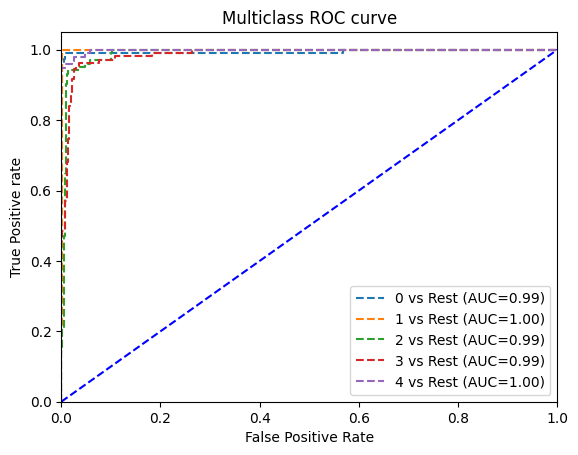

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=model.predict_proba(x_test_sel7)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

###sbe diagram

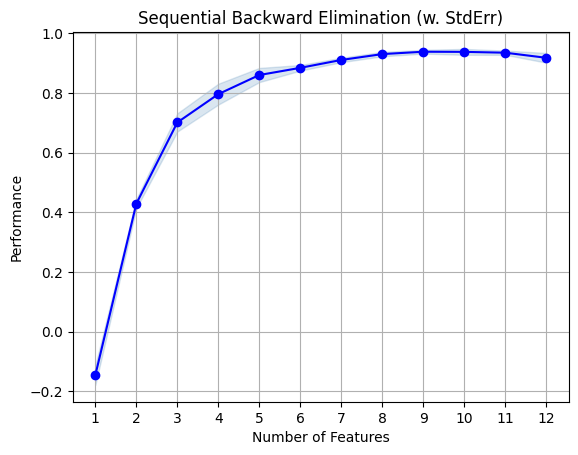

In [ ]:
fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_err',)

plt.title('Sequential Backward Elimination (w. StdErr)')
plt.grid()
plt.show()

###hyper prameter tuning after sbe

In [ ]:
svc = SVC()
parameters = {'C': np.logspace(-3, 2, 6),  # Regularization parameter
    'gamma': ['scale', 'auto'],  # Kernel coefficient
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],  # Kernel type
    'degree': [2, 3, 4],  # Degree of the polynomial kernel function (if kernel='poly')
    'class_weight': ['balanced', None]}
grid = RandomizedSearchCV(svc,param_distributions=parameters,cv=5,n_jobs=-1,scoring='accuracy')
grid.fit(X_train_sel7,y_train)
print("best score : ",grid.best_score_)
print("best param: ",grid.best_params_)

best score :  0.9943705951556332
best param:  {'kernel': 'rbf', 'gamma': 'scale', 'degree': 4, 'class_weight': None, 'C': 100.0}


**Applying ANN**

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

In [ ]:
model = Sequential()

# model.add(Flatten(input_shape=(28,28)))
model.add(Dense(128,activation='relu', input_shape=(12,) ))
model.add(Dense(64,activation='relu'))
model.add(Dense(5,activation='softmax'))
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 128)                 │           1,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 5)                   │             325 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,245 (40.02 KB)

 Trainable params: 10,245 (40.02 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:

model.compile(loss='sparse_categorical_crossentropy',optimizer='Adam',metrics=['accuracy'])
history = model.fit(x_train,y_train,epochs=10)
y_prob = model.predict(x_test)

Epoch 1/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6649 - loss: 1.1775
Epoch 2/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9493 - loss: 0.2690
Epoch 3/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9792 - loss: 0.1182
Epoch 4/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9858 - loss: 0.0872
Epoch 5/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9919 - loss: 0.0568
Epoch 6/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9958 - loss: 0.0355
Epoch 7/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9952 - loss: 0.0329
Epoch 8/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9976 - loss: 0.0221
Epoch 9/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9959 - loss: 0.0236
Epoch 10/10
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9970 - loss: 0.0162
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


In [ ]:
x = pd.DataFrame(y_train)

In [ ]:
x.value_counts()

0    437
1    437
2    437
3    437
4    437
Name: count, dtype: int64

In [ ]:
y=y_test.value_counts()

In [ ]:
y

0    96
2     9
4     9
3     6
1     3
Name: count, dtype: int64

In [ ]:
y7_pred = y_prob.argmax(axis=1)

In [ ]:
print("Accuracy Score of ANN: ",accuracy_score(y_test, y7_pred))
print("Classification Report:\n", classification_report(y_test, y7_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y7_pred))

Accuracy Score of ANN:  0.9024390243902439
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96        96
           1       1.00      0.67      0.80         3
           2       0.86      0.67      0.75         9
           3       0.44      0.67      0.53         6
           4       1.00      0.44      0.62         9

    accuracy                           0.90       123
   macro avg       0.85      0.69      0.73       123
weighted avg       0.92      0.90      0.90       123

Confusion Matrix:
 [[95  0  1  0  0]
 [ 1  2  0  0  0]
 [ 1  0  6  2  0]
 [ 2  0  0  4  0]
 [ 2  0  0  3  4]]


#roc for ANN

In [ ]:
from sklearn.preprocessing import label_binarize

pred_prob=model.predict_proba(x_test)
classes = np.unique(y_test)
y_test_binarized = label_binarize(y_test, classes=classes)


fpr={}
tpr={}
thresh={}
roc_auc=dict()
n_classes=5
n_class = classes.shape[0]
for i in range(n_class):
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test_binarized[:,i], pred_prob[:,i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    # plotting
    plt.plot(fpr[i], tpr[i], linestyle='--',
             label='%s vs Rest (AUC=%0.2f)'%(classes[i],roc_auc[i]))

plt.plot([0,1],[0,1],'b--')
plt.xlim([0,1])
plt.ylim([0,1.05])
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='lower right')
plt.show()

#kfold cross validation

In [ ]:
# Define the model (replace this with your specific model)
model1 = (model)
x_train = np.array(x_train)
y_train = np.array(y_train)

k_folds = 5  # You can adjust this based on your preference

# Initialize KFold
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Define a function to create and compile your model (if necessary)
def create_model():
    # Replace with your model architecture
    return model1

# Perform k-fold cross-validation manually
cross_val_results = []
for train_index, val_index in kf.split(x_train):
    # Split the data
    x_train_fold, x_val_fold = x_train[train_index], x_train[val_index]
    y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

    # Create a new instance of the model
    model1

    # Compile the model (if needed)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Train the model on the current fold
    model.fit(x_train_fold, y_train_fold, epochs=10)

    # Evaluate the model on the validation data for this fold
    _, accuracy = model.evaluate(x_val_fold, y_val_fold, verbose=0)
    cross_val_results.append(accuracy)

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

#Applying cross validation for all of them after using smote

In [ ]:
print("KNN crossvalidate accuracy:",np.mean(cross_val_score(knn,x_train,y_train,scoring='accuracy',cv=10)))
print("logisticRegression crossvalidate accuracy",np.mean(cross_val_score(lr,x_train,y_train,scoring='accuracy',cv=10)))
print("RandOM forest crossvalidate accuracy:",np.mean(cross_val_score(rf,x_train,y_train,scoring='accuracy',cv=10)))
print("AdaBoost crossvalidate accuracy:",np.mean(cross_val_score(ab,x_train,y_train,scoring='accuracy',cv=10)))
print("XGBOOST crossvalidate accuracy:",np.mean(cross_val_score(xgb_model,x_train,y_train,scoring='accuracy',cv=10)))
print("Decision treee crossvalidate accuracy:",np.mean(cross_val_score(dt,x_train,y_train,scoring='accuracy',cv=10)))
print("SVM crossvalidate accuracy:",np.mean(cross_val_score(model,x_train,y_train,scoring='accuracy',cv=10)))


KNN crossvalidate accuracy: 0.9901518143126673


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

logisticRegression crossvalidate accuracy 0.9254310912202186
RandOM forest crossvalidate accuracy: 0.9976525821596244
AdaBoost crossvalidate accuracy: 0.9901518143126673
XGBOOST crossvalidate accuracy: 0.996246325303848
Decision treee crossvalidate accuracy: 0.977482339519986
SVM crossvalidate accuracy: 0.9648435786055899


#training accuracy and validation accuracy

In [ ]:
t_knn = KNeighborsClassifier()
t_knn.fit(x_train, y_train)

# Predict on the training set
t_y_train_pred = t_knn.predict(x_train)

# Calculate training accuracy
training_accuracy = accuracy_score(y_train, t_y_train_pred)
print("Training Accuracy:", training_accuracy)
print("Classification Report:\n", classification_report(y_train, t_y_train_pred))
print("Confusion Matrix:\n", confusion_matrix(y_train, t_y_train_pred))

Training Accuracy: 0.9939024390243902
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.97      0.98       423
           1       1.00      1.00      1.00       416
           2       0.99      1.00      0.99       431
           3       0.99      1.00      1.00       426
           4       0.99      1.00      1.00       436

    accuracy                           0.99      2132
   macro avg       0.99      0.99      0.99      2132
weighted avg       0.99      0.99      0.99      2132

Confusion Matrix:
 [[410   0   6   4   3]
 [  0 416   0   0   0]
 [  0   0 431   0   0]
 [  0   0   0 426   0]
 [  0   0   0   0 436]]


In [ ]:
t_model = (t_knn)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(t_model, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.99063232 0.98594848 0.99530516 0.98826291 0.98591549]
Mean Accuracy: 0.989212872865609


In [ ]:
t_log=LogisticRegression()
t_log.fit(x_train,y_train)
t_y_train_pred = t_log.predict(x_train)
training_accuracy = accuracy_score(y_train, t_y_train_pred)
print("Training Accuracy:", training_accuracy)
print("Classification Report:\n", classification_report(y_train, t_y_train_pred))
print("Confusion Matrix:\n", confusion_matrix(y_train, t_y_train_pred))

Training Accuracy: 0.9291744840525328
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.94      0.95       423
           1       1.00      1.00      1.00       416
           2       0.90      0.86      0.88       431
           3       0.85      0.90      0.87       426
           4       0.95      0.95      0.95       436

    accuracy                           0.93      2132
   macro avg       0.93      0.93      0.93      2132
weighted avg       0.93      0.93      0.93      2132

Confusion Matrix:
 [[398   2  14   4   5]
 [  0 416   0   0   0]
 [ 10   0 370  43   8]
 [  4   0  29 383  10]
 [  0   0   0  22 414]]


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
t_model = (t_log)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(t_model, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Cross-Validation Results: [0.92974239 0.90163934 0.91549296 0.9342723  0.92488263]
Mean Accuracy: 0.9212059240690043


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

In [ ]:
t_rf=RandomForestClassifier()
t_rf.fit(x_train,y_train)
t_y_train_pred = t_rf.predict(x_train)
training_accuracy = accuracy_score(y_train, t_y_train_pred)
print("Training Accuracy:", training_accuracy)
print("Classification Report:\n", classification_report(y_train, t_y_train_pred))

Training Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       423
           1       1.00      1.00      1.00       416
           2       1.00      1.00      1.00       431
           3       1.00      1.00      1.00       426
           4       1.00      1.00      1.00       436

    accuracy                           1.00      2132
   macro avg       1.00      1.00      1.00      2132
weighted avg       1.00      1.00      1.00      2132



In [ ]:
t_model=(t_rf)

# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(t_model, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')


Cross-Validation Results: [0.99531616 0.99531616 0.99765258 1.         0.99530516]
Mean Accuracy: 0.9967180129960088


In [ ]:
from sklearn.multiclass import OneVsRestClassifier
t_ada=OneVsRestClassifier(AdaBoostClassifier())
t_ada.fit(x_train,y_train)
t_y_train_pred = t_ada.predict(x_train)
training_accuracy = accuracy_score(y_train, t_y_train_pred)
print("Training Accuracy:", training_accuracy)
print("Classification Report:\n", classification_report(y_train, t_y_train_pred))
print("Confusion Matrix:\n", confusion_matrix(y_train, t_y_train_pred))


Training Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       423
           1       1.00      1.00      1.00       416
           2       1.00      1.00      1.00       431
           3       1.00      1.00      1.00       426
           4       1.00      1.00      1.00       436

    accuracy                           1.00      2132
   macro avg       1.00      1.00      1.00      2132
weighted avg       1.00      1.00      1.00      2132

Confusion Matrix:
 [[423   0   0   0   0]
 [  0 416   0   0   0]
 [  0   0 431   0   0]
 [  0   0   0 426   0]
 [  0   0   0   0 436]]


In [ ]:
t_model=(t_ada)
# Choose the number of folds (k)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(t_model, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')


Cross-Validation Results: [0.98360656 0.99297424 0.99295775 0.99061033 0.99295775]
Mean Accuracy: 0.9906213235698343


In [ ]:
t_xgb= xgb.XGBClassifier()
t_xgb.fit(x_train,y_train)
t_y_train_pred = t_xgb.predict(x_train)
training_accuracy = accuracy_score(y_train, t_y_train_pred)
print("Training Accuracy:", training_accuracy)
print("Classification Report:\n", classification_report(y_train, t_y_train_pred))
print("Confusion Matrix:\n", confusion_matrix(y_train, t_y_train_pred))

Training Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       423
           1       1.00      1.00      1.00       416
           2       1.00      1.00      1.00       431
           3       1.00      1.00      1.00       426
           4       1.00      1.00      1.00       436

    accuracy                           1.00      2132
   macro avg       1.00      1.00      1.00      2132
weighted avg       1.00      1.00      1.00      2132

Confusion Matrix:
 [[423   0   0   0   0]
 [  0 416   0   0   0]
 [  0   0 431   0   0]
 [  0   0   0 426   0]
 [  0   0   0   0 436]]


In [ ]:
t_model=(t_xgb)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(t_model, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')


Cross-Validation Results: [0.98594848 0.99297424 1.         0.99765258 0.99295775]
Mean Accuracy: 0.9939066090532265


In [ ]:
t_dt= DecisionTreeClassifier()
t_dt.fit(x_train,y_train)
t_y_train_pred = t_dt.predict(x_train)
training_accuracy = accuracy_score(y_train, t_y_train_pred)
print("Training Accuracy:", training_accuracy)
print("Classification Report:\n", classification_report(y_train, t_y_train_pred))
print("Confusion Matrix:\n", confusion_matrix(y_train, t_y_train_pred))

Training Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       423
           1       1.00      1.00      1.00       416
           2       1.00      1.00      1.00       431
           3       1.00      1.00      1.00       426
           4       1.00      1.00      1.00       436

    accuracy                           1.00      2132
   macro avg       1.00      1.00      1.00      2132
weighted avg       1.00      1.00      1.00      2132

Confusion Matrix:
 [[423   0   0   0   0]
 [  0 416   0   0   0]
 [  0   0 431   0   0]
 [  0   0   0 426   0]
 [  0   0   0   0 436]]


In [ ]:
t_model=(t_dt)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(t_model, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.96955504 0.97423888 0.98826291 0.98826291 0.97887324]
Mean Accuracy: 0.9798385944079779


In [ ]:
t_svm= SVC(probability=True)
t_svm.fit(x_train,y_train)
t_y_train_pred = t_svm.predict(x_train)
training_accuracy = accuracy_score(y_train, t_y_train_pred)
print("Training Accuracy:", training_accuracy)
print("Classification Report:\n", classification_report(y_train, t_y_train_pred))
print("Confusion Matrix:\n", confusion_matrix(y_train, t_y_train_pred))

Training Accuracy: 0.973264540337711
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.96      0.97       423
           1       1.00      1.00      1.00       416
           2       0.97      0.94      0.96       431
           3       0.92      1.00      0.96       426
           4       0.99      0.97      0.98       436

    accuracy                           0.97      2132
   macro avg       0.97      0.97      0.97      2132
weighted avg       0.97      0.97      0.97      2132

Confusion Matrix:
 [[406   0  11   3   3]
 [  0 416   0   0   0]
 [  5   0 405  21   0]
 [  0   0   0 426   0]
 [  0   0   0  14 422]]


In [ ]:
t_model=(t_svm)
k_folds = 5  # You can adjust this based on your preference

# Create a k-fold cross-validation object
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_results = cross_val_score(t_model, x_train, y_train, cv=kf, scoring='accuracy')

# Print the cross-validation results
print(f'Cross-Validation Results: {cross_val_results}')
print(f'Mean Accuracy: {np.mean(cross_val_results)}')

Cross-Validation Results: [0.95784543 0.96487119 0.96244131 0.96713615 0.96244131]
Mean Accuracy: 0.9629470813954768


#Hyper parameter tuning

#hyperparameter tuning for random forest

In [ ]:
#hyperparameter_tuning
# n_estimators = [20,60,100,120]
max_features = [0.2,0.6,1.0]
max_depth=[2,8,None]
max_samples =[0.5,0.75,1.0]
parameter_grid={
    'n_estimators': n_estimators,
    'max_features': max_features,
    'max_depth': max_depth,
    'max_samples': max_samples
}
grid = RandomizedSearchCV(estimator=RandomForestClassifier(),
                    param_distributions=parameter_grid,
                    cv=4,
                    verbose =2,
                    n_jobs =-1)
grid.fit(x_train,y_train)
print("best score for random forest: ",grid.best_score_)
print("best parameter for random forest ",grid.best_params_)

Fitting 4 folds for each of 10 candidates, totalling 40 fits
best score for random forest:  0.99812382739212
best parameter for random forest  {'n_estimators': 120, 'max_samples': 0.75, 'max_features': 0.2, 'max_depth': None}


#hyperparameter for adaboost

In [ ]:
grid = dict()
grid['n_estimators']=[10,50,100,500]
grid['learning_rate']=[0.0001,0.001,0.01,0.1,1.0]
grid['algorithm']=['SAMME','SAMME.R']

grid_s = RandomizedSearchCV(estimator=AdaBoostClassifier(),param_distributions=grid,n_jobs=-1,cv=4,scoring='accuracy')
grid_s.fit(x_train,y_train)
print("best score: ",grid_s.best_score_)
print("best parameter for adaboost: ",grid_s.best_params_)


best score:  0.8513133208255159
best parameter for adaboost:  {'n_estimators': 500, 'learning_rate': 0.1, 'algorithm': 'SAMME'}


#hyper parameter tuning for xgboost

In [ ]:
#xgb_hyperparameterTuning
params ={
    "learning_rate"   : [0.15,0.7,1],
    "reg_alpha":[0,0.5,1],
    "reg_lambda":[0,0.5,1],
    "colsample_bytree" :[0.3,0.5,0.8]
}
g_search=RandomizedSearchCV(estimator=xgb.XGBClassifier(), param_distributions=params,n_jobs=-1,cv=4,scoring='accuracy')
g_search.fit(x_train,y_train)
print("best parameter for xgb: ",g_search.best_params_)
print("best score for xgb using hyper parameter ",g_search.best_score_)

best parameter for xgb:  {'reg_lambda': 0.5, 'reg_alpha': 0, 'learning_rate': 0.7, 'colsample_bytree': 0.3}
best score for xgb using hyper parameter  0.99624765478424


#hyperparameter tuning for decision treee

In [ ]:
##hyperParameterTuning for Decision Treeee
param={
    "criterion":["gini","entropy"],
    "max_depth":[1,2,3,4,5,6,7,None],
}
grid = RandomizedSearchCV(DecisionTreeClassifier(),param_distributions=param,cv=4,scoring="accuracy",n_jobs=-1)
grid.fit(x_train,y_train)
print("best score after using hyper parameter tuning : ",grid.best_score_)
print("best param for dt is: ",grid.best_params_)

best score after using hyper parameter tuning :  0.9821763602251408
best param for dt is:  {'max_depth': None, 'criterion': 'gini'}


#hyper parameter for knn

In [ ]:
#knnHyperparameter tuning
param={
    "n_neighbors":[1,2,3,4,5,6,7],
    "weights":["uniform","distance"],
    "algorithm":["ball_tree","kd_tree","brute","auto"]



}
grid = RandomizedSearchCV(KNeighborsClassifier(), param_distributions=param,cv=10,n_jobs=-1,scoring='accuracy')
grid.fit(x_train,y_train)
print("best score : ",grid.best_score_)
print("best param: ",grid.best_params_)

best score :  0.9971830985915492
best param:  {'weights': 'uniform', 'n_neighbors': 2, 'algorithm': 'brute'}


#Hyper parameter tuning for SVM

In [ ]:
svc = SVC()
parameters = {'kernel':['rbf','sigmoid','poly'],
              'C' :[0.1,1.0,10.0,100.0,1000.0,10000.0,100000.0],
              'gamma':[0.00001,0.0001,0.001,0.01,0.1,1.0]}
grid = RandomizedSearchCV(svc,param_distributions=parameters,cv=5,n_jobs=-1,scoring='accuracy')
grid.fit(x_train,y_train)
print("best score : ",grid.best_score_)
print("best param: ",grid.best_params_)

best score :  0.9976525821596244
best param:  {'kernel': 'rbf', 'gamma': 0.1, 'C': 1000.0}


#logistic regression

In [ ]:
# penalty = st.sidebar.selectbox(
#     'Regularization',
#     ('l2', 'l1','elasticnet','none')
# )
# c_input = float(st.sidebar.number_input('C',value=1.0))
# solver = st.sidebar.selectbox(
#     'Solver',
#     ('newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga')
# )
# max_iter = int(st.sidebar.number_input('Max Iterations',value=100))
# multi_class = st.sidebar.selectbox(
#     'Multiclass',
#     ('auto', 'ovr', 'multinomial')
# )
# l1_ratio = int(st.sidebar.number_input('l1 Ratio'))
# clf = RandomizedSearchCV(LogisticRegression(penalty=penalty,C=c_input,solver=solver,max_iter=max_iter,multi_class=multi_class,l1_ratio=l1_ratio))
# clf.fit(x_train,y_train)
# printf("best score : ",clf.best_score_)
# printf("best param: ",clf.best_params_)
logReg=LogisticRegression()
parameters = {
     'C': np.logspace(-3,3,7),
     'penalty': ["l1","l2"]
 }
random = RandomizedSearchCV(logReg,param_distributions=parameters,cv=5,n_jobs=-1,scoring='accuracy')
random.fit(x_train,y_train)
print("best score : ",random.best_score_)
print("best param: ",random.best_params_)

best score :  0.9310518850809778
best param:  {'penalty': 'l2', 'C': 100.0}


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
30 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1169, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/us

In [ ]:
# loR = LogisticRegression(penalty=penalty,C=c_input,solver=solver,max_iter=max_iter,multi_class=multi_class,l1_ratio=l1_ratio)
# loR.fit(x_train,y_train)


#Explanable ai

In [ ]:

import lime
from lime import lime_tabular


In [ ]:
x= pd.DataFrame(x_train)

In [ ]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data = np.array(x_train),
    feature_names = x.columns,
    class_names = ['0','1','2','3','4'],
    mode='classification'
)

In [ ]:
exp= explainer.explain_instance(x.iloc[0],
                                predict_fn=rf.predict_proba)

In [ ]:
exp.show_in_notebook(show_table=True)

In [ ]:
exp= explainer.explain_instance(x.iloc[1],
                                predict_fn=rf.predict_proba)

In [ ]:
exp.show_in_notebook(show_table=True)

In [ ]:
exp= explainer.explain_instance(x.iloc[2],
                                predict_fn=rf.predict_proba)

In [ ]:
exp.show_in_notebook(show_table=True)

In [ ]:
exp= explainer.explain_instance(x.iloc[3],
                                predict_fn=rf.predict_proba)

In [ ]:
exp.show_in_notebook(show_table=True)

In [ ]:
exp= explainer.explain_instance(x.iloc[4],
                                predict_fn=rf.predict_proba)

In [ ]:
exp.show_in_notebook(show_table=True)

In [ ]:
!pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 1.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=bb6da899c8525ef3d82530acc78cc74e488b8cdb3f1b51b57bf16d6dda1c8c57
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
from lime.lime_tabular import LimeTabularExplainer

# Create a LIME explainer
explainer = LimeTabularExplainer(x_train.values, feature_names=x_train.columns, class_names=['class1', 'class2','class3','class4','class5'], mode='classification')

# Select an instance to explain
instance = x_test.iloc[0].values

# Generate explanation
exp = explainer.explain_instance(instance, rf.predict_proba)

# Show the explanation
exp.show_in_notebook(show_all=False)
